In [1]:
%matplotlib widget
%load_ext autoreload
%autoreload 2

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from matplotlib.collections import LineCollection
import matplotlib.patches as patches

from IS2ML_utils import *

*** Earth Engine *** Share your feedback by taking our Annual Developer Satisfaction Survey: https://google.qualtrics.com/jfe/form/SV_0JLhFqfSY1uiEaW?source=Init


In [2]:
fn_features = 'data_paper/lake_segments_depth_features.parquet'
fn_info = 'data_paper/lake_segments_info.parquet'

df_feat = pd.read_parquet(fn_features).reset_index(drop=True)
df_info = pd.read_parquet(fn_info)

# idxs = [3, 4, 5, 8, 11, 12, 14, 16, 46, 71, 74, 80]
idxs = []
valid_ids = df_info.index[idxs]
is_valid = df_feat.apply(lambda x: x.IS2_id in valid_ids, axis=1)
df_feat_valid = df_feat[is_valid].copy()
df_feat_traintest = df_feat[~is_valid].copy()
depth_valid = df_feat_valid.depth
pred_valid = df_feat_valid.iloc[:, 6:]
df_info_traintest = df_info[~df_info.index.isin(valid_ids)].copy()
df_info_valid = df_info.loc[valid_ids].copy()

In [3]:
feat_names = np.array(list(df_feat)[6:])
feat_allvars = np.array(list(df_feat)[6:])
for i,ft in enumerate(feat_names):
    if ft[-4:] == '_log':
        feat_names[i] = 'ln(' + ft[:-4] + ')'
    if ft[-4:] == '_cos':
        feat_names[i] = 'cos(' + ft[:-4] + ')'
    if ft.startswith('ratio_'):
        feat_names[i] = 'ln(%s/%s)' % (ft[9:11], ft[15:])
    if ft.startswith('diff_'):
        feat_names[i] = 'ln(%s)-ln(%s)' % (ft[8:10], ft[14:])
    if ft == 'ndwi':
        feat_names[i] = 'NDWI'
feat_rename = {feat_allvars[i]: feat_names[i] for i in range(len(feat_allvars))}

In [7]:
# feature_list = np.array(list(df_feat)[6:])  # all features
# descr = 'all_features'

# features selected by RF-RFE
# feature_list = ['B3_log', 'ratio_logB3_logB2', 'diff_logB3_logB4', 'diff_logB2_logB3', 'ratio_logB4_logB2', 'B2_log', 'ratio_logB4_logB3',
#  'B4_log', 'ndwi', 'B1_log', 'diff_logB2_logB4', 'B8_log', 'B5_log', 'PhA_B12', 'B6_log', 'AOT_log', 'B7_log', 'VZA_B4_cos', 'SZA_cos']
# descr = 'selected_features'

# features selected by RF-RFE, but adjust bands for angles
feature_list = ['B3_log', 'ratio_logB3_logB2', 'diff_logB3_logB4', 'diff_logB2_logB3', 'ratio_logB4_logB2', 'B2_log', 'ratio_logB4_logB3',
 'B4_log', 'ndwi', 'B1_log', 'diff_logB2_logB4', 'B8_log', 'B5_log', 'PhA_B3', 'B6_log', 'AOT_log', 'B7_log', 'VZA_B3_cos', 'SZA_cos']
descr = 'selected_features_angles'

# # features selected by RF-RFE, but adjust bands for angles
# feature_list = ['B3_log', 'ratio_logB3_logB2', 'diff_logB3_logB4', 'diff_logB2_logB3', 'ratio_logB4_logB2', 'B2_log', 'ratio_logB4_logB3',
#  'B4_log', 'ndwi', 'B1_log', 'diff_logB2_logB4', 'B8_log', 'B5_log', 'B6_log', 'AOT_log', 'B7_log']
# descr = 'selected_features_no_angles'

In [8]:
cv_fold_n = 10

frac_train = 1.0
n_estimators = 1000 # int, default=100
max_features = 0.4 # {“sqrt”, “log2”, None}, int or float, default=1.0 (i.e. max_features=n_features)
max_samples = 0.05 # default=None
min_samples_leaf = 1 # default=1

print('%i - fold cross validation' % cv_fold_n)
print('frac_train = %g\nn_estimators = %g\nmax_features = %g\nmax_samples = %g' % (frac_train, n_estimators, max_features, max_samples))

df_cvstats = pd.DataFrame(columns=['MAE', 'RMSE', 'bias'])
df_cvstats_nnz = pd.DataFrame(columns=['MAE', 'RMSE', 'correlation', 'bias'])
df_info_traintest['cv_assign'] = np.random.permutation(np.arange(len(df_info_traintest)) % cv_fold_n)

regressors = []
cv_depth_dfs = []
imp_list = [] # feature importances by fold

for icv in range(cv_fold_n):

    print('\nfold %i' % (icv+1))

    df_info_test = df_info_traintest[df_info_traintest.cv_assign == icv]
    df_info_train = df_info_traintest[df_info_traintest.cv_assign != icv]
    test_ids = df_info_test.index
    is_test = df_feat.apply(lambda x: x.IS2_id in test_ids, axis=1)
    df_feat_test = df_feat[is_test]
    df_feat_train_full = df_feat[~is_test]
    depth_test = df_feat_test.depth
    pred_test = df_feat_test[feature_list]
    
    df_feat_train = df_feat_train_full.sample(frac=frac_train, replace=False)
    depth_train = df_feat_train.depth
    pred_train = df_feat_train[feature_list]

    # Random Forest Regression
    print('training...', end=' ')
    start_time = time.time()
    rf = RandomForestRegressor(n_estimators=n_estimators, criterion='squared_error',# random_state=42, 
                               max_features=max_features, max_samples=max_samples, min_samples_leaf=min_samples_leaf, n_jobs=-1)
    rf.fit(pred_train, depth_train)
    print('finished in %s' % duration_string(time.time() - start_time))
    
    print('fitting...', end=' ')
    start_time = time.time()
    depth_pred = rf.predict(pred_test)
    # depth_pred[depth_pred < 0.05] = 0.0
    # depth_pred[pred_test.ndwi < 0.1] = 0.0
    print('finished in %s' % duration_string(time.time() - start_time))
    
    # Predictions and evaluation
    is2nz = df_feat_test.depth > 0
    prednz = pred_test.ndwi > 0.14
    depth_test_nnz = depth_test[is2nz & prednz]
    depth_pred_nnz = depth_pred[is2nz & prednz]
    
    # mae = mean_absolute_error(depth_test, depth_pred)
    # rmse = np.sqrt(mean_squared_error(depth_test, depth_pred))
    # bias = np.nanmean(depth_test - depth_pred)
    # df_cvstats.loc[icv] = [mae, rmse, bias]
    # print(f'Mean Absolute Error: {mae}')
    # print(f'Mean Squared Error: {mse}')
    # print(f'Mean Bias: {bias}')

    mae = mean_absolute_error(depth_test_nnz, depth_pred_nnz)
    rmse = np.sqrt(mean_squared_error(depth_test_nnz, depth_pred_nnz))
    bias = np.nanmean(depth_pred_nnz - depth_test_nnz)
    corr = pearsonr(depth_test_nnz, depth_pred_nnz).statistic
    df_cvstats_nnz.loc[icv] = [mae, rmse, corr, bias]
    print(f'Mean Absolute Error: {mae}')
    print(f'Root Mean Squared Error: {rmse}')
    print(f'Correlation: {corr}')
    print(f'Mean Bias: {bias}')

    dfdepths = pd.DataFrame({'is2': depth_test, 'rf_pred': depth_pred, 'cv_fold': icv+1, 'ndwi': df_feat_test.ndwi})
    cv_depth_dfs.append(dfdepths)
    imp_list.append(rf.feature_importances_)

    regressors.append(rf)

cv_depths = pd.concat(cv_depth_dfs)
is2nnz = cv_depths.is2 > 0
ndwinnz = cv_depths.ndwi > 0.14
cv_valid = cv_depths[is2nnz & ndwinnz]
corrcv = pearsonr(cv_valid.is2, cv_valid.rf_pred).statistic
maecv = np.mean(np.abs(cv_valid.is2 - cv_valid.rf_pred))
rmsecv = np.sqrt(np.mean((cv_valid.is2 - cv_valid.rf_pred)**2))
biascv = np.mean(cv_valid.is2 - cv_valid.rf_pred)

imp_median = np.median(np.array(imp_list), axis=0)
errs = np.std(np.array(imp_list), axis=0)
perc75 = np.percentile(np.array(imp_list), 75, axis=0)
perc25 = np.percentile(np.array(imp_list), 25, axis=0)
imp_df = pd.DataFrame({'feat_name': feature_list, 
                       'importance': imp_median, 
                       'stdev': errs, 
                       'perc25': perc25, 
                       'perc75': perc75}).sort_values(by='importance', ascending=False)

# make figure for variable importance
matplotlib.rcParams.update({'font.size': 12})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)
idxsort = np.argsort(-imp_median)
ax.bar(np.arange(len(imp_df))+1, imp_df.importance, alpha=0.35)
ax.boxplot(np.array(imp_list)[:,idxsort]);
ax.plot([0.5,len(imp_df)+0.5], [0]*2, 'r-', lw=0.7)
ax.set_xticks(np.arange(len(imp_df))+1)
featlabels = [feat_rename[x] for x in imp_df.feat_name]
ax.set_xticklabels(featlabels, rotation='vertical', fontsize=12)
ax.set_xlim((0,len(imp_df)+1))
ax.set_ylabel('impurity-based feature importance', fontsize=14)
txt = 'MAE = %5.3f\nRMSE = %5.3f\nR = %5.3f\nbias = %6.3f' % (maecv, rmsecv, corrcv, biascv)
ax.text(0.98, 0.98, txt, transform=ax.transAxes, ha='right', va='top')
fig.tight_layout()
figname = 'plots/rf_variable_importance_%s.jpg' % descr
fig.savefig(figname, dpi=300)
plt.close(fig)
# display(Image(figname))

fig, ax = plt.subplots()
cv_stats_mean = df_cvstats_nnz.mean()
# cv_stats_error = df_cvstats_nnz.std()/np.sqrt(cv_fold_n)
cv_stats_error = df_cvstats_nnz.std()
bars = ax.bar(cv_stats_mean.index, cv_stats_mean, yerr=cv_stats_error, color='gray')
for ib, bar in enumerate(bars):
    fac = 1.2
    fix = 0.02
    highbar = cv_stats_mean.iloc[ib] > (cv_stats_mean.max()*1.05/5)
    adjust =  - 1.2 * cv_stats_error.iloc[ib] - fix if highbar else 1.2 * cv_stats_error.iloc[ib] + fix
    ypos = cv_stats_mean.iloc[ib] + adjust
    algn = 'top' if highbar else 'bottom'
    xpos = bar.get_x() + bar.get_width() / 2
    label = '%.2f\n+/- %.2f' % (cv_stats_mean.iloc[ib], cv_stats_error.iloc[ib])
    ax.text(xpos, ypos, label, ha='center', va=algn, fontsize=10)

# ax.errorbar(cv_stats_mean.index, cv_stats_mean, yerr=cv_stats_error)
ax.set_title('%d-fold cross validation statistics' % cv_fold_n)
ax.set_ylabel('errors')

figname = 'plots/cross_validation_statistics_RF_%s.jpg' % descr
# fig.savefig(figname, dpi=300)
plt.close(fig)
# display(Image(figname))

10 - fold cross validation
frac_train = 1
n_estimators = 1000
max_features = 0.4
max_samples = 0.05

fold 1
training... finished in 12 secs
fitting... finished in 0 secs
Mean Absolute Error: 0.5181643199556182
Root Mean Squared Error: 0.8686060839772805
Correlation: 0.9694166821878619
Mean Bias: -0.08216611678051593

fold 2
training... finished in 11 secs
fitting... finished in 0 secs
Mean Absolute Error: 0.5239953671836175
Root Mean Squared Error: 0.9176628165295502
Correlation: 0.958220408904988
Mean Bias: -0.11031942669172472

fold 3
training... finished in 11 secs
fitting... finished in 0 secs
Mean Absolute Error: 0.5156021587640597
Root Mean Squared Error: 0.9850898828259331
Correlation: 0.9517664623871246
Mean Bias: 0.042371033434650915

fold 4
training... finished in 11 secs
fitting... finished in 0 secs
Mean Absolute Error: 0.47302593650613645
Root Mean Squared Error: 0.9058901156993312
Correlation: 0.9507953067392051
Mean Bias: 0.03250207785738655

fold 5
training... finished 


 selected_features_angles


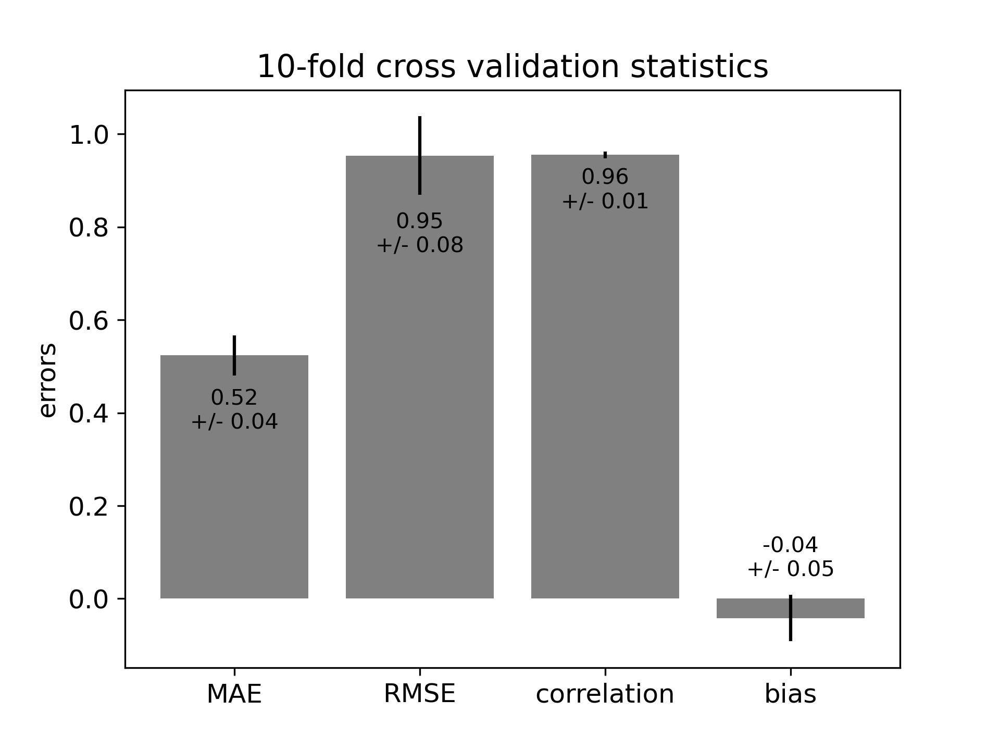

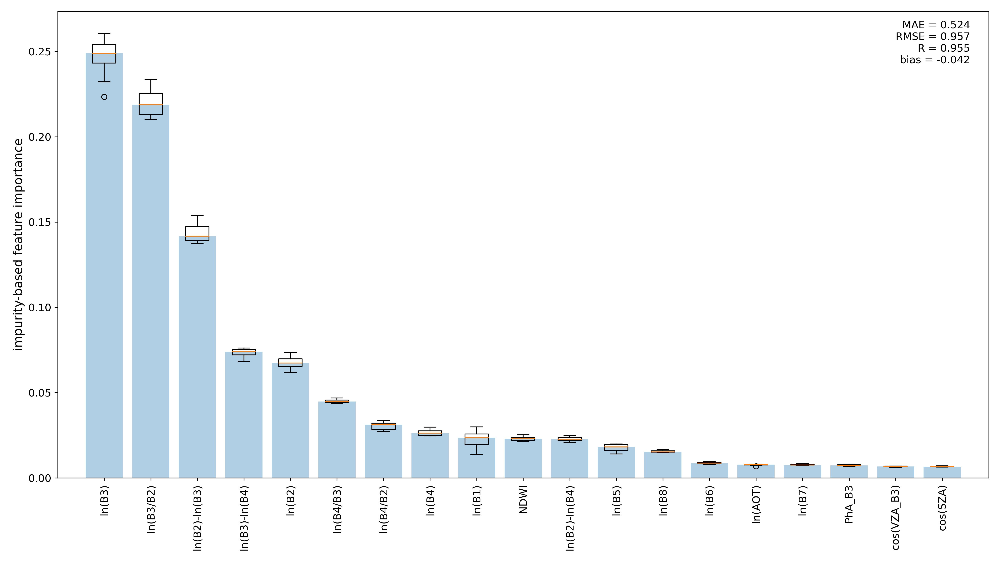

In [6]:
descr = 'selected_features_angles'
print('\n', descr)
display(Image('plots/cross_validation_statistics_RF_%s.jpg' % descr))
display(Image('plots/rf_variable_importance_%s.jpg' % descr))

# descr = 'selected_features_no_angles'
# print('\n', descr)
# display(Image('plots/cross_validation_statistics_RF_%s.jpg' % descr))
# display(Image('plots/rf_variable_importance_%s.jpg' % descr))

# descr = 'all_features'
# print('\n', descr)
# display(Image('plots/cross_validation_statistics_RF_%s.jpg' % descr))
# display(Image('plots/rf_variable_importance_%s.jpg' % descr))

# descr = 'selected_features'
# print('\n', descr)
# display(Image('plots/cross_validation_statistics_RF_%s.jpg' % descr))
# display(Image('plots/rf_variable_importance_%s.jpg' % descr))

# Band ratio

In [9]:
fn_traindata = 'data_paper/lake_segments_depth_reflectance_data.parquet'
fn_info = 'data_paper/lake_segments_info.parquet'

df_data = pd.read_parquet(fn_traindata).reset_index(drop=True)
df_info = pd.read_parquet(fn_info)

df_data['br23'] = np.log(df_data.B2 / df_data.B3)
df_data['br24'] = np.log(df_data.B2 / df_data.B4)
df_data['br34'] = np.log(df_data.B3 / df_data.B4)
df_data.loc[df_data.B3==1.0,'br23'] = np.nan
df_data.loc[df_data.B4==1.0,'br24'] = np.nan
df_data.loc[df_data.B4==1.0,'br34'] = np.nan
for br in ['br23', 'br24', 'br34']:
    df_data.loc[df_data[br] == np.inf, br] = np.nan

thisband = 'B3'
br = 'br23'
ndwi_thresh = 0.23
dfnz = df_data[(df_data[thisband] > 1.0) & (df_data.ndwi > ndwi_thresh) & (df_data.depth>0)].copy()
xfit = np.linspace(-0.5, 7)
params = np.polyfit(dfnz[br], dfnz.depth, 2)
pp = np.poly1d(params)
yfit = pp(xfit)

dfnz['br23_pred'] = pp(dfnz.br23)
is2depth = dfnz.depth
br23depth = dfnz.br23_pred
corr_br23 = pearsonr(br23depth, is2depth).statistic
mae_br23 = np.mean(np.abs(br23depth - is2depth))
rmse_br23 = np.sqrt(np.mean((br23depth - is2depth)**2))
bias_br23 = np.mean(br23depth - is2depth)
txt_br23 = 'correlation = %.2f\nMAE = %.2f m\nRMSE = %.2f m' % (corr_br23, mae_br23, rmse_br23)
print(txt_br23)

# is2nz = df_data.depth>0
# ndwi_nz = df_data.ndwi > 0.14
# br_valid = df_data[thisband] > 1.0
# df_data['br23_pred'] = pp(df_data.br23)
# df_data.loc[df_data.ndwi < ndwi_thresh, 'br23_pred'] = 0.0 # following moussavi et al., 2016
# is2depth = df_data[is2nz & br_valid].depth
# br23depth = df_data[is2nz & br_valid].br23_pred
# corr_br23 = pearsonr(br23depth, is2depth).statistic
# mae_br23 = np.mean(np.abs(br23depth - is2depth))
# rmse_br23 = np.sqrt(np.mean((br23depth - is2depth)**2))
# bias_br23 = np.mean(br23depth - is2depth)
# txt_br23 = 'correlation = %.2f\nMAE = %.2f m\nRMSE = %.2f m\nbias = %.2f m' % (corr_br23, mae_br23, rmse_br23, bias_br23)
# print(txt_br23)

correlation = 0.70
MAE = 1.36 m
RMSE = 2.20 m


In [13]:
shallow = is2depth <= 5
print(np.mean(np.abs(br23depth[shallow] - is2depth[shallow])))
print(np.mean(np.abs(br23depth[~shallow] - is2depth[~shallow])))

0.89203817
2.9988966


2.9988966

In [15]:
shallow = cv_valid.is2 <= 5
print(np.mean(np.abs(cv_valid.is2[shallow] - cv_valid.rf_pred[shallow])))
print(np.mean(np.abs(cv_valid.is2[~shallow] - cv_valid.rf_pred[~shallow])))

0.3556420738505656
1.1191926778264223


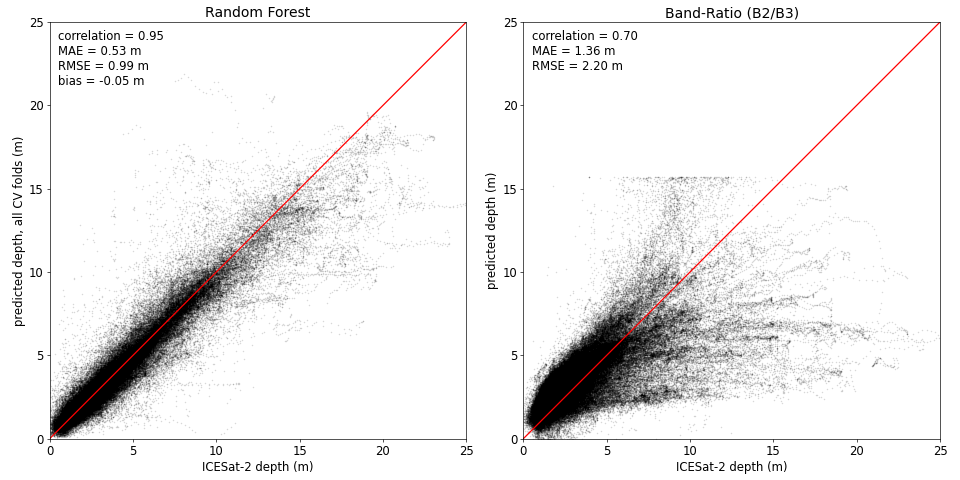

In [10]:
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(figsize=[16, 8], dpi=60, ncols=2)
cv_depths = pd.concat(cv_depth_dfs)
is2nnz = cv_depths.is2 > 0
ndwinnz = cv_depths.ndwi > 0.14
cv_valid = cv_depths[is2nnz & ndwinnz]
# cv_valid = cv_depths[is2nnz]
# cv_valid = cv_depths

ax = axs[0]
ax.scatter(cv_valid.is2, cv_valid.rf_pred, s=1, color='k', alpha=0.1)
ax.plot([0,25], [0,25], 'r-')
ax.set_aspect(1)
ax.set_xlabel('ICESat-2 depth (m)')
ax.set_ylabel('predicted depth, all CV folds (m)')
ax.set_title('Random Forest')
ax.set_xlim((0,25))
ax.set_ylim((0,25))

corrcv = pearsonr(cv_valid.is2, cv_valid.rf_pred).statistic
maecv = np.mean(np.abs(cv_valid.is2 - cv_valid.rf_pred))
rmsecv = np.sqrt(np.mean((cv_valid.is2 - cv_valid.rf_pred)**2))
biascv = np.mean(cv_valid.rf_pred - cv_valid.is2)
txt_cv = 'correlation = %.2f\nMAE = %.2f m\nRMSE = %.2f m\nbias = %.2f m' % (corrcv, maecv, rmsecv, biascv)
ax.text(0.02, 0.98, txt_cv, transform=ax.transAxes, ha='left', va='top')
# print(txt_cv)

ax = axs[1]
ax.scatter(is2depth, br23depth, s=1, color='k', alpha=0.1)
ax.plot([0,25], [0,25], 'r-')
ax.set_aspect(1)
ax.set_xlabel('ICESat-2 depth (m)')
ax.set_ylabel('predicted depth (m)')
ax.set_title('Band-Ratio (B2/B3)')
ax.set_xlim((0,25))
ax.set_ylim((0,25))
ax.text(0.02, 0.98, txt_br23, transform=ax.transAxes, ha='left', va='top')

fig.tight_layout()
# fig.savefig('plots/RF_vs_bandratio.jpg', dpi=300)

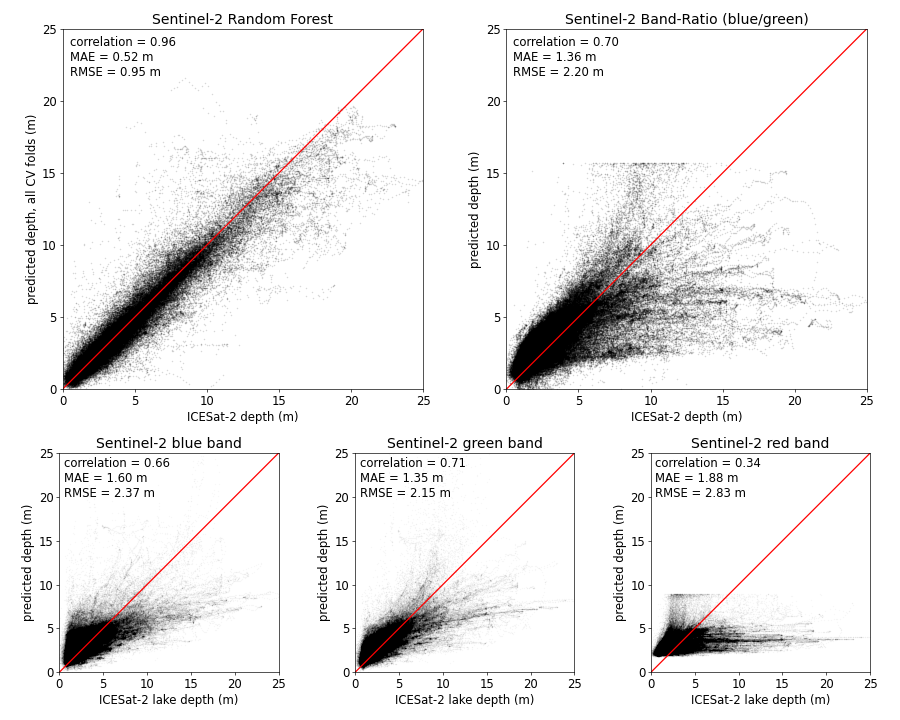

In [738]:
from matplotlib.gridspec import GridSpec
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig = plt.figure(figsize=[15, 12], dpi=60)
gs = GridSpec(5, 6, figure=fig)
axs = []
axs.append(fig.add_subplot(gs[:3, :3]))
axs.append(fig.add_subplot(gs[:3, 3:]))
axs.append(fig.add_subplot(gs[3:, :2]))
axs.append(fig.add_subplot(gs[3:, 2:4]))
axs.append(fig.add_subplot(gs[3:, 4:]))

ax = axs[0]
ax.scatter(cv_valid.is2, cv_valid.rf_pred, s=1, color='k', alpha=0.1)
ax.plot([0,25], [0,25], 'r-')
ax.set_aspect(1)
ax.set_xlabel('ICESat-2 depth (m)')
ax.set_ylabel('predicted depth, all CV folds (m)')
ax.set_title('Sentinel-2 Random Forest')
ax.set_xlim((0,25))
ax.set_ylim((0,25))

corrcv = pearsonr(cv_valid.is2, cv_valid.rf_pred).statistic
maecv = np.mean(np.abs(cv_valid.is2 - cv_valid.rf_pred))
rmsecv = np.sqrt(np.mean((cv_valid.is2 - cv_valid.rf_pred)**2))
biascv = np.mean(cv_valid.rf_pred - cv_valid.is2)
txt_cv = 'correlation = %.2f\nMAE = %.2f m\nRMSE = %.2f m' % (0.96, 0.52, 0.95)
ax.text(0.02, 0.98, txt_cv, transform=ax.transAxes, ha='left', va='top')

ax = axs[1]
ax.scatter(is2depth, br23depth, s=1, color='k', alpha=0.1)
ax.plot([0,25], [0,25], 'r-')
ax.set_aspect(1)
ax.set_xlabel('ICESat-2 depth (m)')
ax.set_ylabel('predicted depth (m)')
ax.set_title('Sentinel-2 Band-Ratio (blue/green)')
ax.set_xlim((0,25))
ax.set_ylim((0,25))
ax.text(0.02, 0.98, txt_br23, transform=ax.transAxes, ha='left', va='top')

alph = 0.02
is2nz = df_data.depth > 0
ndwinz = df_data.ndwi > 0.23
bandnames = ['blue', 'green', 'red']
for i, thisband in enumerate(['B2', 'B3', 'B4']):
    ax = axs[i+2]
    dfp = df_data[is2nz & ndwinz & (df_data[thisband]>1)].copy()
    dfp['%s_logval' % thisband] = np.log(dfp[thisband]/10000)
    params = np.polyfit(dfp['%s_logval' % thisband],dfp.depth, 1)
    pp = np.poly1d(params)
    dfp['%s_pred' % thisband] = pp(dfp['%s_logval' % thisband])
    dfp.loc[dfp.ndwi < 0.23, 'b2_pred'] = 0.0 # following moussavi et al., 2016
    ax.scatter(dfp.depth, dfp['%s_pred' % thisband], s=1, color='k', alpha=alph)
    ax.plot([0,25], [0,25], 'r-')
    corr = pearsonr(dfp['%s_pred' % thisband], dfp.depth).statistic
    mae = np.mean(np.abs(dfp['%s_pred' % thisband] - dfp.depth))
    rmse = np.sqrt(np.mean((dfp['%s_pred' % thisband] - dfp.depth)**2))
    txt = 'correlation = %.2f\nMAE = %.2f m\nRMSE = %.2f m' % (corr, mae, rmse)
    ax.text(0.02, 0.98, txt, transform=ax.transAxes, ha='left', va='top')
    ax.set_xlabel('ICESat-2 lake depth (m)')
    ax.set_ylabel('predicted depth (m)')
    ax.set_title('Sentinel-2 %s band' % bandnames[i])
    ax.set_xlim((0,25))
    ax.set_ylim((0,25))
    ax.set_aspect(1)

fig.tight_layout()
fig.savefig('plots/RF_vs_others.jpg', dpi=300)

# Single Band Reflectances vs Depth

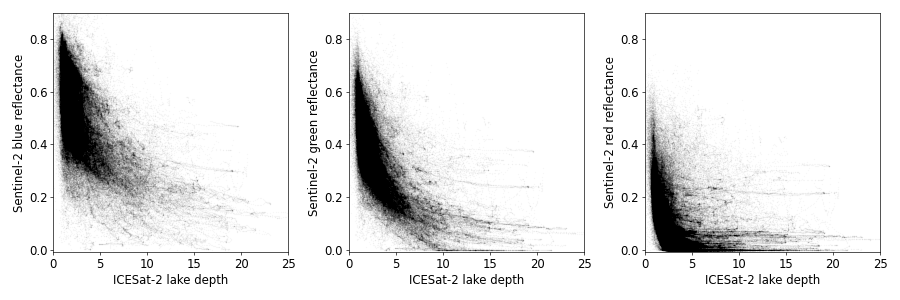

In [619]:
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(figsize=[15, 5], dpi=60, ncols=3)

alph = 0.02

is2nz = df_data.depth > 0
ndwinz = df_data.ndwi > 0.14
dfp = df_data[is2nz & ndwinz]

ax = axs[0]
ax.scatter(dfp.depth, dfp.B2/10000, s=1, color='k', alpha=alph)
ax.set_ylabel('Sentinel-2 blue reflectance')

ax = axs[1]
ax.scatter(dfp.depth, dfp.B3/10000, s=1, color='k', alpha=alph)
ax.set_ylabel('Sentinel-2 green reflectance')

ax = axs[2]
ax.scatter(dfp.depth, dfp.B4/10000, s=1, color='k', alpha=alph)
ax.set_ylabel('Sentinel-2 red reflectance')

for ax in axs:
    ax.set_xlim((0,25))
    ax.set_ylim((-0.01,0.9))
    ax.set_xlabel('ICESat-2 lake depth')

fig.tight_layout()

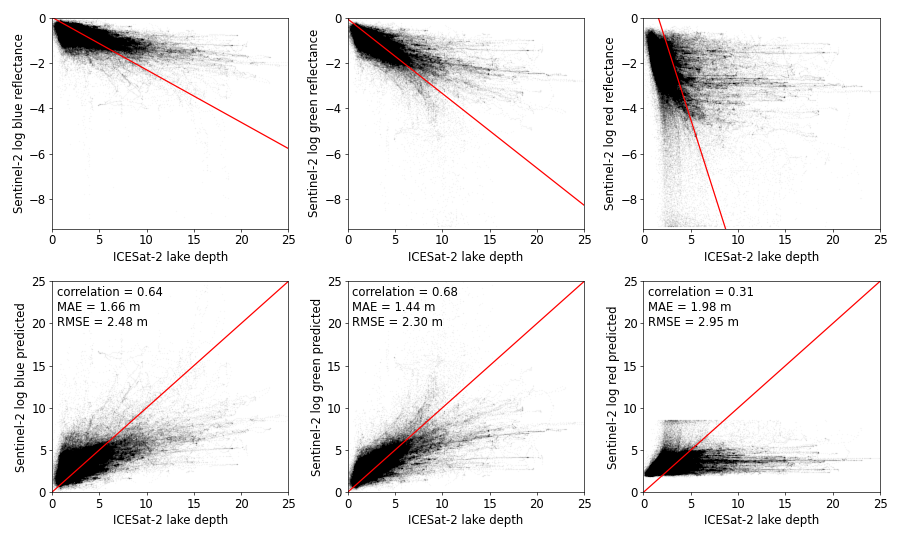

In [705]:
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(figsize=[15, 9], dpi=60, ncols=3, nrows=2)

alph = 0.02
is2nz = df_data.depth > 0
ndwinz = df_data.ndwi > 0.14
bandnames = ['blue', 'green', 'red']
for i, thisband in enumerate(['B2', 'B3', 'B4']):
    ax = axs[0][i]
    # print((df_data[thisband]<=1).sum())
    dfp = df_data[is2nz & ndwinz & (df_data[thisband]>1)].copy()
    dfp['%s_logval' % thisband] = np.log(dfp[thisband]/10000)
    ax.scatter(dfp.depth, dfp['%s_logval' % thisband], s=1, color='k', alpha=alph)
    xfit = np.linspace(-10, 0)
    params = np.polyfit(dfp['%s_logval' % thisband],dfp.depth, 1)
    # print(params)
    pp = np.poly1d(params)
    yfit = pp(xfit)
    ax.plot(yfit, xfit, 'r-')
    dfp['%s_pred' % thisband] = pp(dfp['%s_logval' % thisband])
    dfp.loc[dfp.ndwi < 0.23, 'b2_pred'] = 0.0 # following moussavi et al., 2016
    ax.set_ylabel('Sentinel-2 log %s reflectance' % bandnames[i])
    ax.set_xlim((0,25))
    ax.set_ylim((-9.3,0))
    ax.set_xlabel('ICESat-2 lake depth')

    ax = axs[1][i]
    ax.scatter(dfp.depth, dfp['%s_pred' % thisband], s=1, color='k', alpha=alph)
    ax.plot([0,25], [0,25], 'r-')
    corr = pearsonr(dfp['%s_pred' % thisband], dfp.depth).statistic
    mae = np.mean(np.abs(dfp['%s_pred' % thisband] - dfp.depth))
    rmse = np.sqrt(np.mean((dfp['%s_pred' % thisband] - dfp.depth)**2))
    txt = 'correlation = %.2f\nMAE = %.2f m\nRMSE = %.2f m' % (corr, mae, rmse)
    ax.text(0.02, 0.98, txt, transform=ax.transAxes, ha='left', va='top')
    ax.set_xlabel('ICESat-2 lake depth')
    ax.set_ylabel('Sentinel-2 log %s predicted' % bandnames[i])
    ax.set_xlim((0,25))
    ax.set_ylim((0,25))
    
fig.tight_layout()

In [673]:
dfp['%s_logval' % thisband].min()

-inf

Plotting density scatter...  --> Done!
Plotting density scatter...  --> Done!
Plotting density scatter...  --> Done!


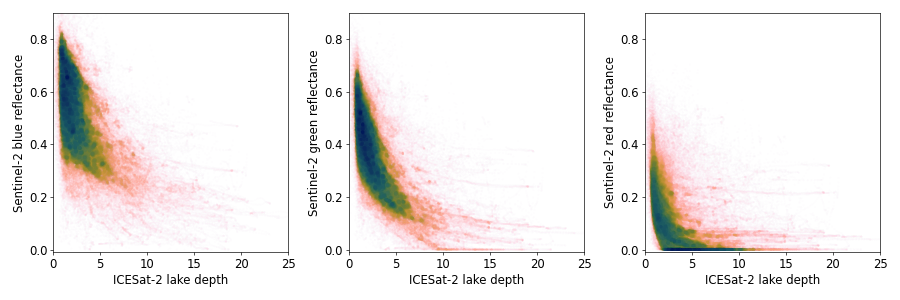

In [658]:
from sklearn.neighbors import KDTree
nscatt = 5
v_max = 1.

def density_scatter(x, y, ax=None, sort=True, wid=0.1, K_pts=30, scattersize_min=1, scattersize_max=10, cmap=cmc.batlow, **kwargs):
    """
    Scatter plot colored by 2d histogram
    """

    x = np.asarray(x)
    y = np.asarray(y)

    print('Plotting density scatter... ', end='')
    if ax is None :
        fig , ax = plt.subplots()
        xnorm = (x - np.nanmin(x)) /  (np.nanmax(x) - np.nanmin(x))
        ynorm = (y - np.nanmin(y)) /  (np.nanmax(y) - np.nanmin(y))
    else:
        minx, maxx = ax.get_xlim()
        miny, maxy = ax.get_ylim()
        xnorm = (x - minx) /  (maxx - minx)
        ynorm = (y - miny) /  (maxy - miny)

    # get density
    Xn = np.array(np.transpose(np.vstack((xnorm, ynorm))))
    kdt = KDTree(Xn)
    idx, dist = kdt.query_radius(Xn, r=wid, count_only=False, return_distance=True, sort_results=True)
    density = (np.array([np.sum(1-np.abs(x/wid)) if (len(x)<(K_pts+1)) 
               else np.sum(1-np.abs(x[:K_pts+1]/wid))
               for x in dist]) - 1) / K_pts

    #To be sure to plot all data
    density[np.where(np.isnan(density))] = 0.0
    density = density
    density /= np.nanmax(density)

    # Sort the points by density, so that the densest points are plotted last
    if sort :
        idx = density.argsort()
        x, y, density = x[idx], y[idx], density[idx]

    ax.scatter( x, y, c=density, s=(1-density)*scattersize_max+scattersize_min, cmap=cmap, **kwargs )

    print(' --> Done!')

    return ax

import matplotlib.colors as colors
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = truncate_colormap(cmc.batlow_r, minval=0.0, maxval=1.0, n=100)
# cmap_g = colors.LinearSegmentedColormap.from_list("white_green_black", ["white", "green", "darkgreen"])

plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig, axs = plt.subplots(figsize=[15, 5], dpi=60, ncols=3)

for ax in axs:
    ax.set_xlim((0,25))
    ax.set_ylim((-0.01,0.9))
    ax.set_xlabel('ICESat-2 lake depth')

alph = 0.05
kpt = 500
wid = 0.01
scsz_min = 3
scsz_max = 1

is2nz = df_data.depth > 0
ndwinz = df_data.ndwi > 0.14
dfp = df_data[is2nz & ndwinz]

ax = axs[0]
# ax.scatter(dfp.depth, dfp.B2/10000, s=1, color='k', alpha=alph)
density_scatter(dfp.depth, dfp.B2/10000, ax=ax, wid=wid, K_pts=kpt, edgecolors='none', alpha=alph, cmap=cmap, vmin=0, vmax=v_max,
                scattersize_min=scsz_min, scattersize_max=scsz_max)
ax.set_ylabel('Sentinel-2 blue reflectance')

ax = axs[1]
# ax.scatter(dfp.depth, dfp.B3/10000, s=1, color='k', alpha=alph)
density_scatter(dfp.depth, dfp.B3/10000, ax=ax, wid=wid, K_pts=kpt, edgecolors='none', alpha=alph, cmap=cmap, vmin=0, vmax=v_max,
                scattersize_min=scsz_min, scattersize_max=scsz_max)
# from scipy.stats import gaussian_kde
# nbins = 300
# x = dfp.depth[:10000]
# y = dfp.B3[:10000]/10000
# k = gaussian_kde([x, y])
# xi, yi = np.mgrid[
#    x.min():x.max():nbins*1j,
#    y.min():y.max():nbins*1j
# ]
# zi = k(np.vstack([
#    xi.flatten(),
#    yi.flatten()
# ])).reshape(xi.shape)
# ax.pcolormesh(xi, yi, zi)
# ax.hist2d(dfp.depth, dfp.B3/10000, bins=300, cmap=cmc.lajolla)
ax.set_ylabel('Sentinel-2 green reflectance')

ax = axs[2]
density_scatter(dfp.depth, dfp.B4/10000, ax=ax, wid=wid, K_pts=kpt, edgecolors='none', alpha=alph, cmap=cmap, vmin=0, vmax=v_max,
                scattersize_min=scsz_min, scattersize_max=scsz_max)
# ax.scatter(dfp.depth, dfp.B4/10000, s=1, color='k', alpha=alph)
ax.set_ylabel('Sentinel-2 red reflectance')

fig.tight_layout()
fig.savefig('plots/reflectance_vs_depth_visible.jpg', dpi=300)

5

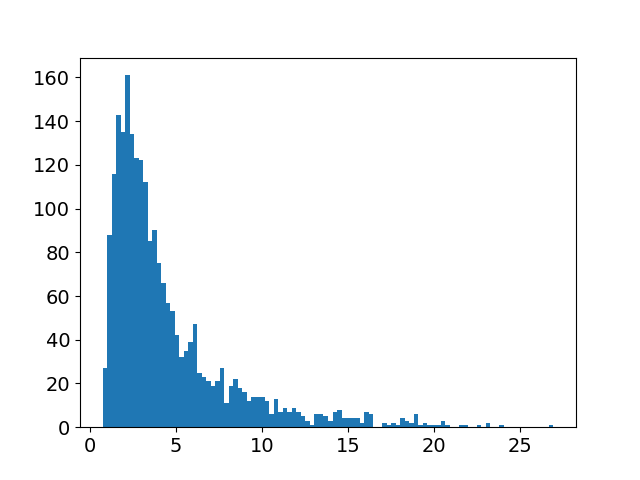

In [575]:
fig, ax = plt.subplots()
# ax.hist(df_feat.depth[df_feat.depth>0], bins=100)
ax.hist(df_info.max_depth, bins=100)
df_feat.depth.sort_values(ascending=False)
(df_info.max_depth > 22).sum()

In [459]:
mean_squared_error(cv_depths.is2, cv_depths.rf_pred)

0.6899171503243753

In [462]:
pearsonr(cv_depths.is2, cv_depths.rf_pred).statistic

0.9628995348846265

In [356]:
idxs = [3, 4, 5, 8, 11, 12, 14, 16, 46, 71, 74, 80]
valid_ids = df_info.index[idxs]
is_valid = df_feat.apply(lambda x: x.IS2_id in valid_ids, axis=1)
df_feat_valid = df_feat[is_valid].copy()
df_feat_traintest = df_feat[~is_valid].copy()
depth_valid = df_feat_valid.depth
pred_valid = df_feat_valid.iloc[:, 6:]
df_info_traintest = df_info[~df_info.index.isin(valid_ids)].copy()
df_info_valid = df_info.loc[valid_ids].copy()

In [357]:
from sklearn.base import BaseEstimator, RegressorMixin

class MeanEnsembleRegressor(BaseEstimator, RegressorMixin):
    def __init__(self, regressors):
        self.regressors = regressors
    
    def fit(self, X, y):
        # Assume regressors are already fitted
        pass
    
    def predict(self, X):
        # Collect predictions from all regressors
        predictions = np.column_stack([regressor.predict(X) for regressor in self.regressors])
        # Return the mean of predictions
        return np.mean(predictions, axis=1)

# Combine them into the MeanEnsembleRegressor
ensemble_regressor = MeanEnsembleRegressor(regressors)

# Make predictions
depth_valid_pred = ensemble_regressor.predict(pred_valid)
depth_valid_pred[pred_valid.ndwi < 0.1] = 0.0

mae = mean_absolute_error(depth_valid, depth_valid_pred)
mse = mean_squared_error(depth_valid, depth_valid_pred)
bias = np.nanmean(depth_valid - depth_valid_pred)
print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Mean Bias: {bias}')
df_result_valid = df_feat_valid.copy()
df_result_valid['depth_pred'] = depth_valid_pred

NameError: name 'regressors' is not defined

In [358]:
import pickle

from sklearn.base import BaseEstimator, RegressorMixin

class MeanEnsembleRegressor(BaseEstimator, RegressorMixin):
    def __init__(self, regressors):
        self.regressors = regressors
    
    def fit(self, X, y):
        # Assume regressors are already fitted
        pass
    
    def predict(self, X):
        # Collect predictions from all regressors
        predictions = np.column_stack([regressor.predict(X) for regressor in self.regressors])
        # Return the mean of predictions
        return np.mean(predictions, axis=1)

# # Assuming ensemble_regressor is your fitted MeanEnsembleRegressor
# with open('models/ensemble_regressor_test.pkl', 'wb') as f:
#     pickle.dump(ensemble_regressor, f)

with open('models/ensemble_regressor_test.pkl', 'rb') as f:
    loaded_ensemble_regressor = pickle.load(f)
    
# # Make predictions
depth_valid_pred = loaded_ensemble_regressor.predict(pred_valid)
depth_valid_pred[pred_valid.ndwi < 0.1] = 0.0

mae = mean_absolute_error(depth_valid, depth_valid_pred)
mse = mean_squared_error(depth_valid, depth_valid_pred)
bias = np.nanmean(depth_valid - depth_valid_pred)
print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Mean Bias: {bias}')
df_result_valid = df_feat_valid.copy()
df_result_valid['depth_pred'] = depth_valid_pred

Mean Absolute Error: 0.2816346852875852
Mean Squared Error: 0.26312088997893857
Mean Bias: 0.07442389131392853


In [424]:
preds_all = df_feat.iloc[:, 6:]
dpred_ = loaded_ensemble_regressor.predict(preds_all)

In [429]:
dpred_

array([0.0753206 , 0.10926053, 0.10171511, ..., 0.        , 0.        ,
       0.        ])

In [431]:
dpred = dpred_.copy()
dpred[preds_all.ndwi < 0.1] = 0.0
dpred[dpred < 0.05] = 0.0

In [369]:
dpred = dpred_

In [433]:
is2nnz = df_feat.depth > 0
mae = mean_absolute_error(df_feat.depth[is2nnz], dpred[is2nnz])
mae

0.3936200010250074

Text(0, 0.5, 'RF-predicted depth')

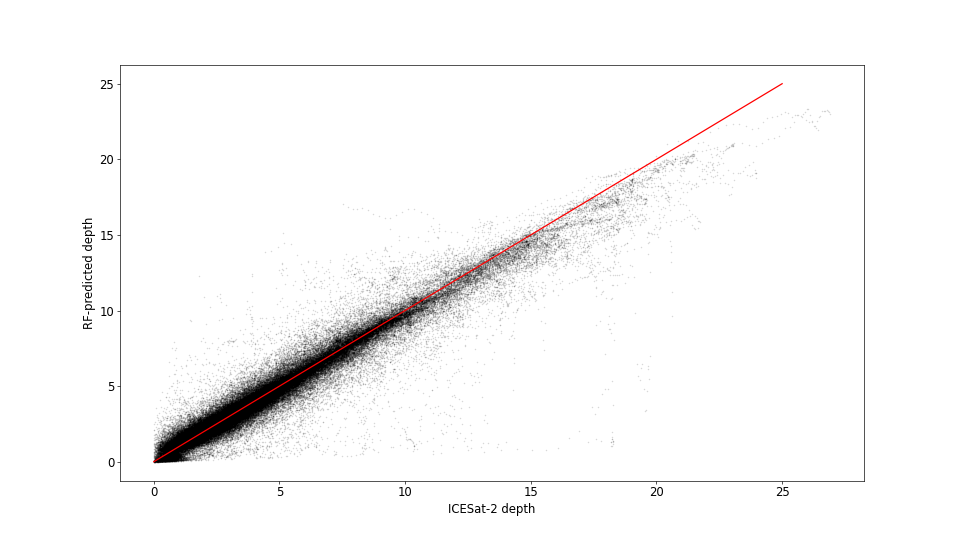

In [423]:
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)
is2nnz = df_feat.depth > 0
ax.scatter(df_feat.depth[is2nnz], dpred[is2nnz], s=1, color='k', alpha=0.1)
ax.plot([0,25], [0,25], 'r-')
ax.set_xlabel('ICESat-2 depth')
ax.set_ylabel('RF-predicted depth')

In [371]:
mae = mean_absolute_error(df_feat.depth[df_feat.depth>0], dpred[df_feat.depth>0])
mae

0.38709546575546167

In [ ]:
# depth_valid_pred = depth_valid * 0.0
# for estimator in regressors:
#     depth_valid_pred += estimator.predict(pred_valid)

# depth_valid_pred /= cv_fold_n
# depth_valid_pred[pred_valid.ndwi < 0.1] = 0.0

# mae = mean_absolute_error(depth_valid, depth_valid_pred)
# mse = mean_squared_error(depth_valid, depth_valid_pred)
# bias = np.nanmean(depth_valid - depth_valid_pred)
# print(f'Mean Absolute Error: {mae}')
# print(f'Mean Squared Error: {mse}')
# print(f'Mean Bias: {bias}')
# df_result_valid = df_feat_valid.copy()
# df_result_valid['depth_pred'] = depth_valid_pred

In [15]:
imp_list = [forest.feature_importances_ for forest in loaded_ensemble_regressor.regressors]

In [75]:
imp_median = np.median(np.array(imp_list), axis=0)
errs = np.std(np.array(imp_list), axis=0)
perc75 = np.percentile(np.array(imp_list), 75, axis=0)
perc25 = np.percentile(np.array(imp_list), 25, axis=0)
imp_df = pd.DataFrame({'feat_name': list(df_feat)[6:], 
                       'importance': imp_median, 
                       'stdev': errs, 
                       'perc25': perc25, 
                       'perc75': perc75}).sort_values(by='importance', ascending=False)

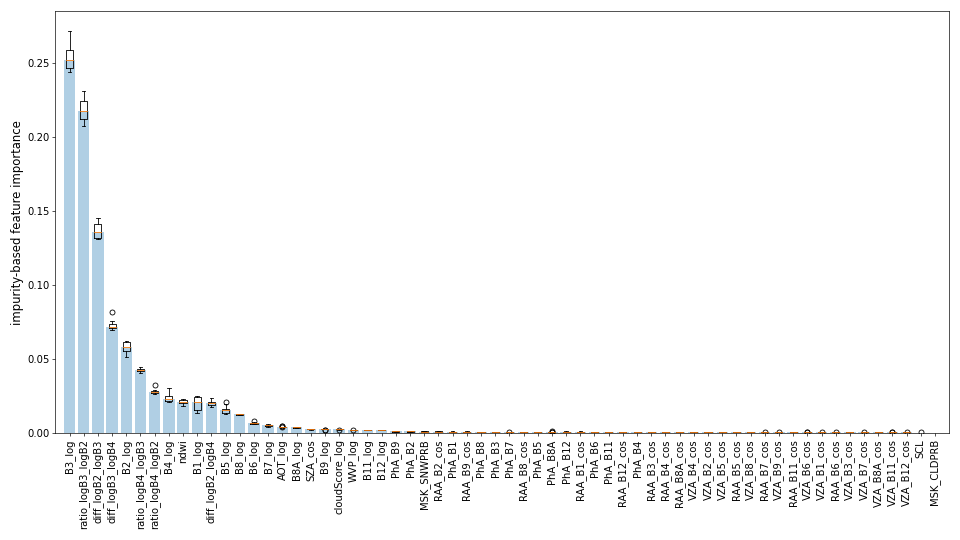

In [343]:
matplotlib.rcParams.update({'font.size': 12})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)
idxsort = np.argsort(-imp_median)
ax.bar(np.arange(len(imp_df))+1, imp_df.importance, alpha=0.35)
ax.boxplot(np.array(imp_list)[:,idxsort]);
ax.plot([0.5,len(imp_df)+0.5], [0]*2, 'r-', lw=0.7)
ax.set_xticks(np.arange(len(imp_df))+1)
ax.set_xticklabels(imp_df.feat_name, rotation='vertical', fontsize=12)
ax.set_xlim((0,len(imp_df)+1))
ax.set_ylabel('impurity-based feature importance', fontsize=14)
fig.tight_layout()

# Band Ratio

In [415]:
fn_traindata = 'data_paper/lake_segments_depth_reflectance_data.parquet'
fn_info = 'data_paper/lake_segments_info.parquet'

df_data = pd.read_parquet(fn_traindata).reset_index(drop=True)
df_info = pd.read_parquet(fn_info)

df_data['br23'] = np.log(df_data.B2 / df_data.B3)
df_data['br24'] = np.log(df_data.B2 / df_data.B4)
df_data['br34'] = np.log(df_data.B3 / df_data.B4)
df_data.loc[df_data.B3==1.0,'br23'] = np.nan
df_data.loc[df_data.B4==1.0,'br24'] = np.nan
df_data.loc[df_data.B4==1.0,'br34'] = np.nan
for br in ['br23', 'br24', 'br34']:
    df_data.loc[df_data[br] == np.inf, br] = np.nan

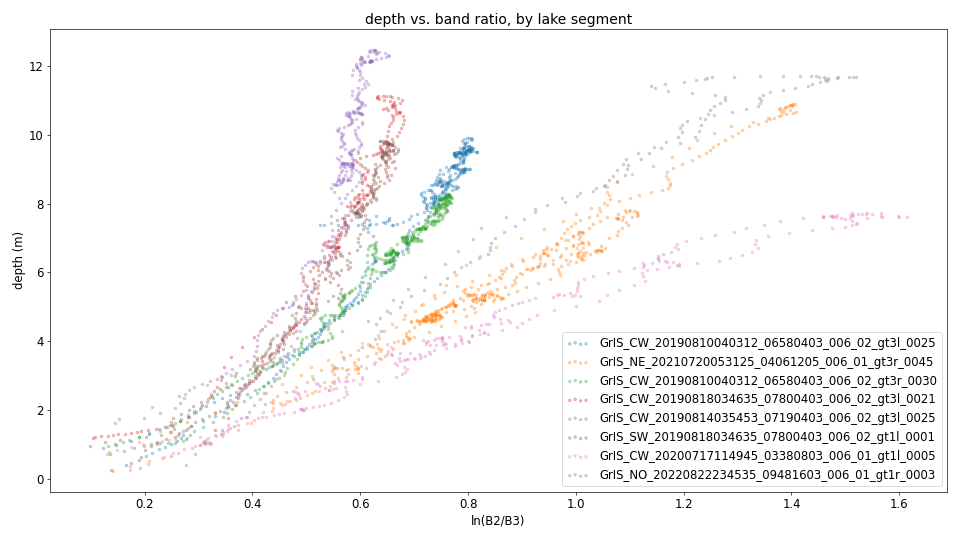

In [744]:
lakelist = df_data.groupby('IS2_id')['lat'].count().sort_values(ascending=False).index
lakelist = df_info[df_info.n_scenes==1].sort_values(by='conf_mean', ascending=False).index
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)

thisband = 'B3'
for i in range(8):
    dfnz = df_data[(df_data.depth>0) & (df_data[thisband] > 1.0) & (df_data.ndwi > 0.23)].copy()
    dfnz = dfnz[dfnz.IS2_id == lakelist[i]]
    # ax.scatter(np.log(dfnz.B3/10000), dfnz.depth, s=10, color='C%d'%i, alpha=0.3, label=lakelist[i])
    ax.scatter(dfnz.br23, dfnz.depth, s=10, color='C%d'%i, alpha=0.3, label=lakelist[i])
ax.legend(loc='lower right', scatterpoints=4)
ax.set_xlabel('ln(B2/B3)')
ax.set_ylabel('depth (m)')
ax.set_title('depth vs. band ratio, by lake segment')
# ax.set_xlim((0,2))
# ax.set_ylim((0,12))
fig.tight_layout()

32


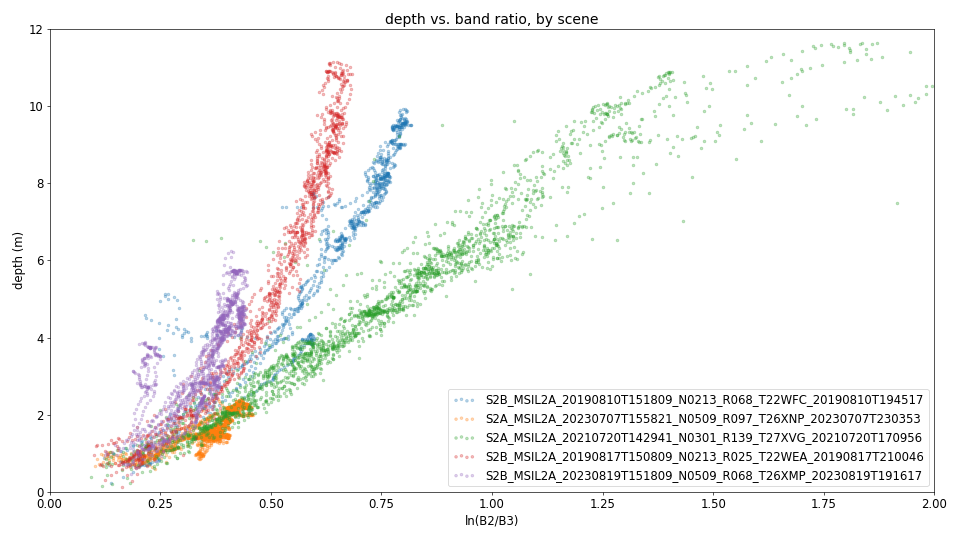

In [740]:
# scenelist = df_data.groupby('S2_id')['lat'].count().sort_values(ascending=False).index
s2ids = df_data[df_data.depth>0].groupby('S2_id')['lat'].count().sort_values(ascending=False)
s2ids = s2ids[s2ids>1000].index
print(len(s2ids))
scenelist = df_data[df_data.S2_id.apply(lambda x: x in s2ids)].groupby('S2_id')['conf'].mean().sort_values(ascending=False).index
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)

thisband = 'B3'
for i in range(5):
    dfnz = df_data[(df_data.depth>0) & (df_data[thisband] > 1.0) & (df_data.ndwi > 0.23)].copy()
    dfnz = dfnz[dfnz.S2_id == scenelist[i]]
    ax.scatter(dfnz.br23, dfnz.depth, s=10, color='C%d'%i, alpha=0.3, label=scenelist[i])
ax.legend(loc='lower right', scatterpoints=4)
ax.set_xlabel('ln(B2/B3)')
ax.set_ylabel('depth (m)')
ax.set_title('depth vs. band ratio, by scene')
ax.set_xlim((0,2))
ax.set_ylim((0,12))
fig.tight_layout()

[-1.36318079e+00  9.25447608e+00  7.18412986e-03]
MAE ln(B2/B3) =  1.4879804


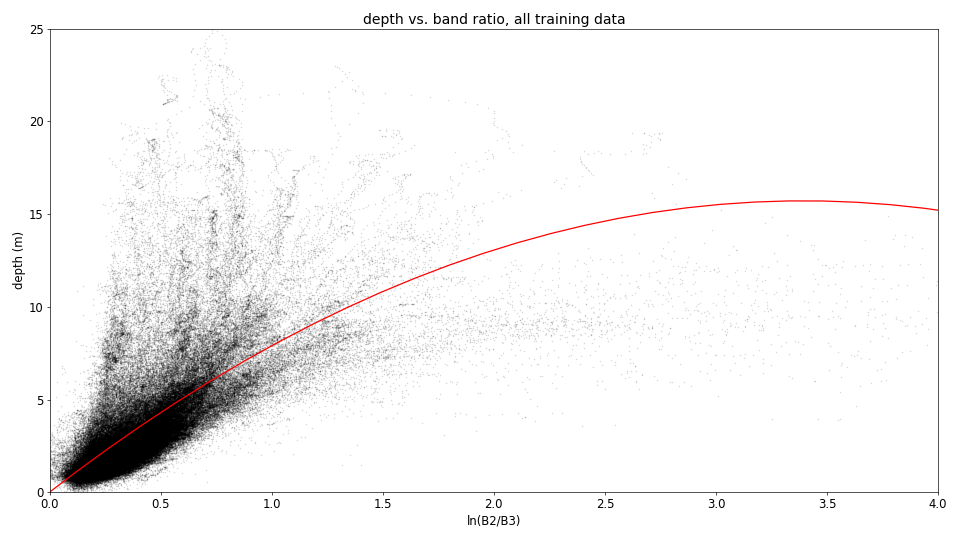

In [418]:
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)
thisband = 'B3'
br = 'br23'
# dfnz = df_data[(df_data.depth>0) & (df_data[thisband] > 1.0)]
dfnz = df_data[(df_data[thisband] > 1.0) & (df_data.ndwi > 0.23) & (df_data.depth>0)]
# ax.scatter(np.log(dfnz[thisband]), dfnz.depth, s=1, color='k', alpha=0.1)
ax.scatter(dfnz[br], dfnz.depth, s=1, color='k', alpha=0.1)
ax.set_xlabel('ln(B2/B3)')
ax.set_ylabel('depth (m)')
ax.set_title('depth vs. band ratio, all training data')

xfit = np.linspace(-0.5, 7)
params = np.polyfit(dfnz[br], dfnz.depth, 2)
print(params)
pp = np.poly1d(params)
yfit = pp(xfit)
# yfit = quadratic(xfit, *params)
#ax.plot(xfit, yfit_init, 'b-')
ax.plot(xfit, yfit, 'r-')
ax.set_xlim((0,4))
ax.set_ylim((0,25))
fig.tight_layout()

df_data['br23_pred'] = pp(df_data.br23)
df_data.loc[df_data.ndwi < 0.23, 'br23_pred'] = 0.0 # following moussavi et al., 2016
mae_br23 = np.mean(np.abs(df_data[df_data.depth>0].br23_pred - df_data[df_data.depth>0].depth))
print('MAE ln(B2/B3) = ', mae_br23)
# np.mean(np.abs(df_data.br23_pred - df_data.depth))

In [514]:
def doy_from_s2id(s2id):
    dtstr = '%s-%s-%s' % (s2id[11:15], s2id[15:17], s2id[17:19])
    dttm = datetime.strptime(dtstr, '%Y-%m-%d')
    doy = dttm.timetuple().tm_yday
    return doy
    
df_data['doy'] = df_data.S2_id.apply(doy_from_s2id)

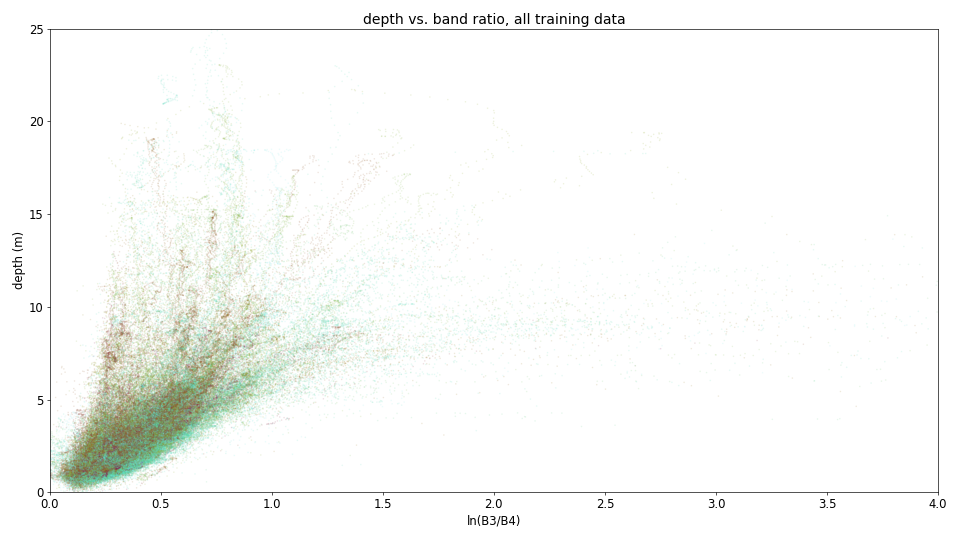

In [516]:
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)
thisband = 'B3'
br = 'br23'
# dfnz = df_data[(df_data.depth>0) & (df_data[thisband] > 1.0)]
dfnz = df_data[(df_data[thisband] > 1.0) & (df_data.ndwi > 0.23) & (df_data.depth>0)]

#ax.scatter(dfnz[br], dfnz.depth, s=1, color='k', alpha=0.1)
ax.scatter(dfnz[br], dfnz.depth, s=1, c=dfnz.lat, cmap=cmc.hawaii, alpha=0.1)

ax.set_xlabel('ln(B3/B4)')
ax.set_ylabel('depth (m)')
ax.set_title('depth vs. band ratio, all training data')

# xfit = np.linspace(-0.5, 7)
# params = np.polyfit(dfnz[br], dfnz.depth, 2)
# print(params)
# pp = np.poly1d(params)
# yfit = pp(xfit)
# # yfit = quadratic(xfit, *params)
# #ax.plot(xfit, yfit_init, 'b-')
# ax.plot(xfit, yfit, 'r-')
ax.set_xlim((0,4))
ax.set_ylim((0,25))
fig.tight_layout()

# df_data['br34_pred'] = pp(df_data.br34)
# df_data.loc[df_data.ndwi < 0.23, 'br34_pred'] = 0.0 # following moussavi et al., 2016
# mae_br34 = np.mean(np.abs(df_data[df_data.depth>0].br34_pred - df_data[df_data.depth>0].depth))
# print('MAE ln(B3/B4) = ', mae_br34)
# np.mean(np.abs(df_data.br23_pred - df_data.depth))

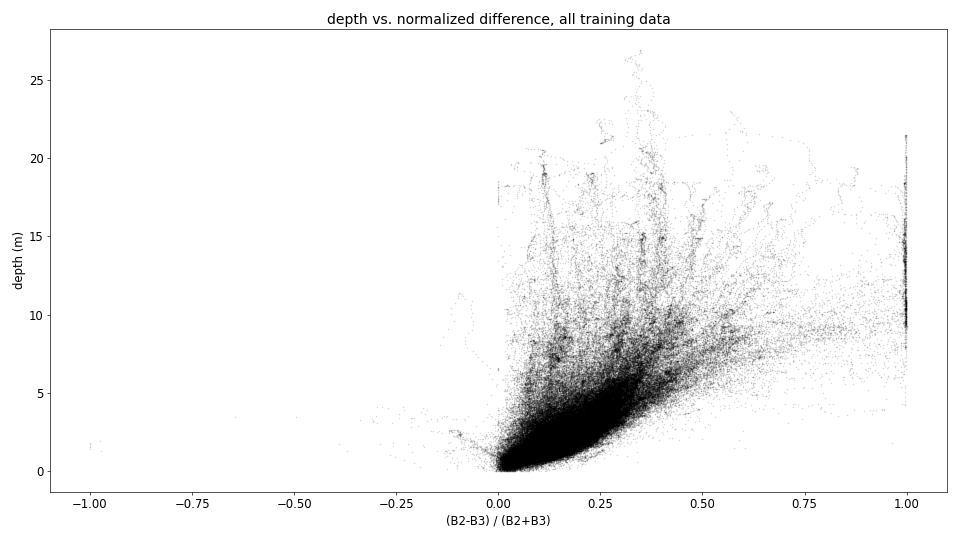

In [412]:
plt.close('all')

xp = 0
df_data['br23_'] = np.log((df_data.B2 + xp)  / (df_data.B3 + xp))
# df_data['br23_'] = np.log((df_data.B2 - df_data.B3) / (df_data.B2 + df_data.B3))
df_data['br23_'] = (df_data.B2 - df_data.B3) / (df_data.B2 + df_data.B3)

df_data['br32_'] = np.log(df_data.B3 / df_data.B2)

# df_data.loc[df_data.B3==1.0,'br23_'] = np.nan
# for br in ['br23_']:
#     df_data.loc[df_data[br] == np.inf, br] = np.nan
    
matplotlib.rcParams.update({'font.size': 14})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)
thisband = 'B3'
br = 'br23_'
# dfnz = df_data[(df_data.depth>0) & (df_data[thisband] > 1.0)]
dfnz = df_data[(df_data[thisband] > 1.0) & (df_data.ndwi > 0.1) & (df_data.depth>0)]
dfnz = df_data[df_data.depth>0]
# ax.scatter(np.log(dfnz[thisband]), dfnz.depth, s=1, color='k', alpha=0.1)
ax.scatter(dfnz[br], dfnz.depth, s=1, color='k', alpha=0.1)
ax.set_xlabel('(B2-B3) / (B2+B3)')
ax.set_ylabel('depth (m)')
ax.set_title('depth vs. normalized difference, all training data')

# xfit = np.linspace(-0.5, 7)
# params = np.polyfit(dfnz[br], dfnz.depth, 2)
# print(params)
# pp = np.poly1d(params)
# yfit = pp(xfit)
# yfit = quadratic(xfit, *params)
#ax.plot(xfit, yfit_init, 'b-')
# ax.plot(xfit, yfit, 'r-')
# ax.set_xlim((0,4))
# ax.set_ylim((0,25))
fig.tight_layout()

[ 0.06849597 -0.25991541  3.56039754]


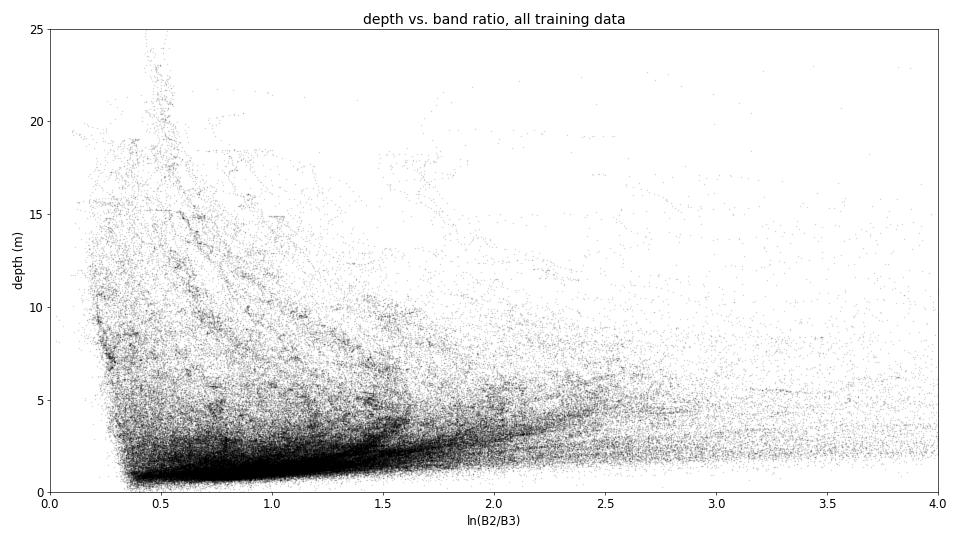

In [394]:
plt.close('all')
matplotlib.rcParams.update({'font.size': 14})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)
thisband = 'B4'
br = 'br34'
# dfnz = df_data[(df_data.depth>0) & (df_data[thisband] > 1.0)]
dfnz = df_data[(df_data[thisband] > 1.0) & (df_data.ndwi > 0.23) & (df_data.depth>0)]
# ax.scatter(np.log(dfnz[thisband]), dfnz.depth, s=1, color='k', alpha=0.1)
ax.scatter(dfnz[br], dfnz.depth, s=1, color='k', alpha=0.1)
ax.set_xlabel('ln(B4/B3)')
ax.set_ylabel('depth (m)')
ax.set_title('depth vs. band ratio, all training data')

xfit = np.linspace(-0.5, 7)
params = np.polyfit(dfnz[br], dfnz.depth, 2)
print(params)
pp = np.poly1d(params)
yfit = pp(xfit)
# yfit = quadratic(xfit, *params)
#ax.plot(xfit, yfit_init, 'b-')
# ax.plot(xfit, yfit, 'r-')
ax.set_xlim((0,4))
ax.set_ylim((0,25))
fig.tight_layout()

In [414]:
df_data['br23_pred'] = pp(df_data.br23)
df_data.loc[df_data.ndwi < 0.23, 'br23_pred'] = 0.0 # following moussavi et al., 2016
np.mean(np.abs(df_data[df_data.depth>0].br23_pred - df_data[df_data.depth>0].depth))
# np.mean(np.abs(df_data.br23_pred - df_data.depth))

2.7479842

In [389]:
np.mean(np.abs(df_data.br23_pred - df_data.depth))

0.85856706

1.4879804

In [354]:
np.sqrt(np.mean((df_data.br23_pred - df_data.depth)**2))

1.9231768

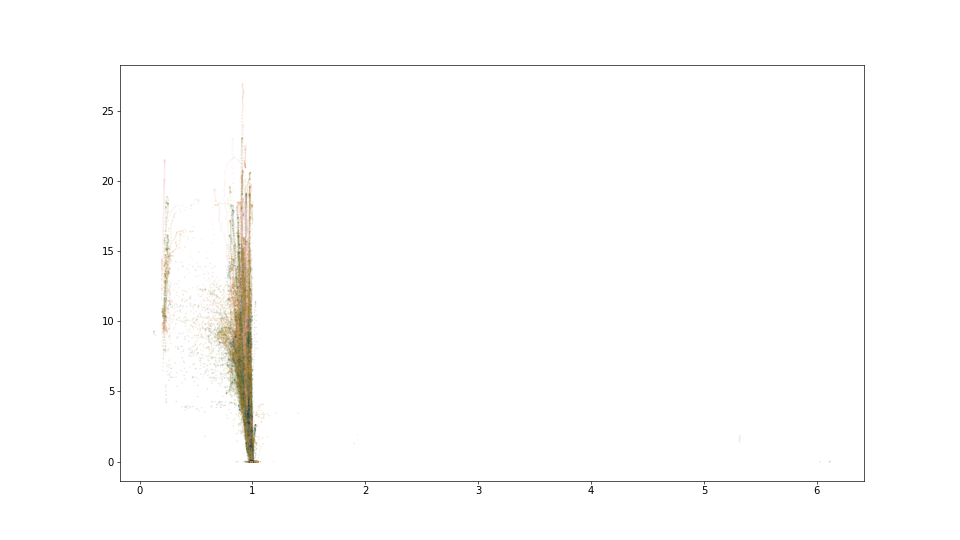

In [494]:
plt.close('all')
matplotlib.rcParams.update({'font.size': 12})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)
thisband = 'B2'
dfnz = df_data[(df_data.depth>0) & (dfnz[thisband] > 1.0)]
dfnz = df_data
#ax.scatter(np.log(dfnz[thisband]), dfnz.depth, s=1, c=dfnz.SZA, cmap=cmc.batlow, alpha=0.1)
ax.scatter(df_feat.ratio_logB3_logB2, df_feat.depth, s=1, c=df_feat.PhA_B3, cmap=cmc.batlow, alpha=0.1)

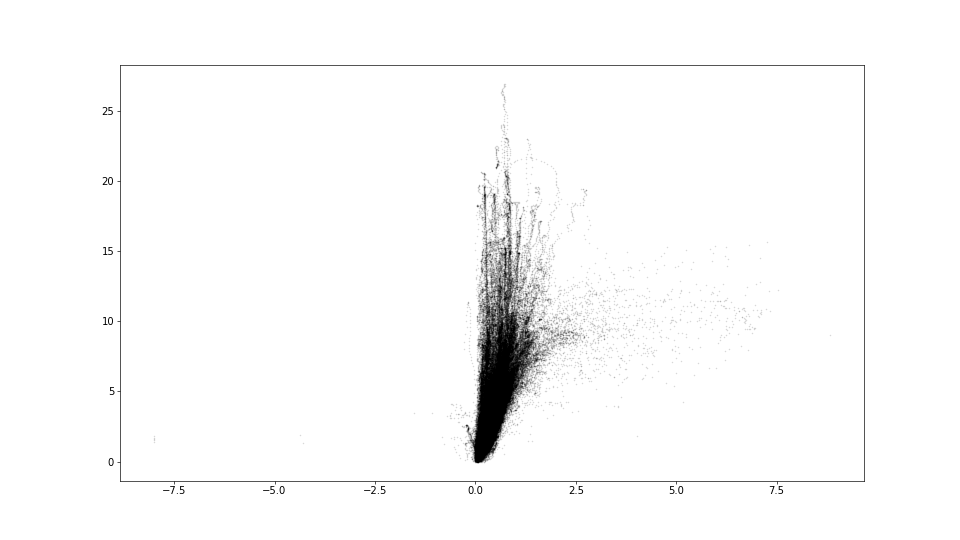

In [134]:
matplotlib.rcParams.update({'font.size': 12})
fig,ax = plt.subplots(figsize=[16, 9], dpi=60)
dfnz = df_data[df_data.depth>0]
ax.scatter(dfnz.br23, dfnz.depth, s=1, color='k', alpha=0.1)

In [87]:
df_data.B4.isna().sum()

0

In [88]:
df_data

,lat,lon,xatc,depth,conf,B1,B2,B3,B4,B5,...,VAA_B7,VAA_B8,VAA_B8A,VAA_B9,VAA_B11,VAA_B12,tdiff_sec,plot_id,S2_id,IS2_id
0,72.073990,-29.450998,0,0.0,1.0,6688.543457,6986.828613,6655.683594,5468.768555,5412.355469,...,129.140808,122.966743,130.164505,132.276794,128.439865,131.013351,13652,0,S2A_MSIL2A_20190801T140021_N0213_R010_T26XMF_2...,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013
1,72.074036,-29.451017,5,0.0,1.0,6711.386719,6923.382324,6582.771484,5366.189453,5430.356934,...,129.141846,122.967110,130.165665,132.278183,128.440079,131.013687,13652,1,S2A_MSIL2A_20190801T140021_N0213_R010_T26XMF_2...,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013
2,72.074081,-29.451038,10,0.0,1.0,6722.000000,6888.133789,6558.980469,5363.494629,5448.570801,...,129.142899,122.967476,130.166840,132.279602,128.440308,131.014023,13652,2,S2A_MSIL2A_20190801T140021_N0213_R010_T26XMF_2...,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013
3,72.074120,-29.451057,15,0.0,1.0,6722.000000,6884.432129,6570.425293,5422.663574,5449.859375,...,129.143967,122.967850,130.168015,132.281021,128.440536,131.014359,13652,3,S2A_MSIL2A_20190801T140021_N0213_R010_T26XMF_2...,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013
4,72.074165,-29.451077,20,0.0,1.0,6722.000000,6875.430176,6549.433594,5459.770508,5343.522949,...,129.145050,122.968224,130.169220,132.282471,128.440765,131.014709,13652,4,S2A_MSIL2A_20190801T140021_N0213_R010_T26XMF_2...,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411970,73.558708,-29.110100,565,0.0,1.0,9006.000000,9583.398438,9344.062500,8908.396484,8806.237305,...,262.960419,279.774933,260.789398,256.757324,265.531219,260.152557,66456,113,S2B_MSIL2A_20190825T142749_N0213_R139_T26XMG_2...,GrIS_NE_20190826015540_09010403_006_02_gt2l_0006
411971,73.558754,-29.110123,570,0.0,1.0,9006.000000,9568.665039,9352.403320,8905.625000,8815.000000,...,262.895142,279.739746,260.720245,256.681152,265.470886,260.082550,66456,114,S2B_MSIL2A_20190825T142749_N0213_R139_T26XMG_2...,GrIS_NE_20190826015540_09010403_006_02_gt2l_0006
411972,73.558800,-29.110146,575,0.0,1.0,9006.000000,9525.254883,9338.622070,8882.081055,8797.713867,...,262.829987,279.704620,260.651184,256.605072,265.410614,260.012665,66456,115,S2B_MSIL2A_20190825T142749_N0213_R139_T26XMG_2...,GrIS_NE_20190826015540_09010403_006_02_gt2l_0006
411973,73.558846,-29.110167,580,0.0,1.0,9006.000000,9477.775391,9292.062500,8867.558594,8716.368164,...,262.764893,279.669525,260.582214,256.529114,265.350464,259.942841,66456,116,S2B_MSIL2A_20190825T142749_N0213_R139_T26XMG_2...,GrIS_NE_20190826015540_09010403_006_02_gt2l_0006


In [79]:
idxs = [3, 4, 5, 8, 11, 12, 14, 16, 46, 71, 74, 80]
idxs = []
valid_ids = df_info.index[idxs]
is_valid = df_feat.apply(lambda x: x.IS2_id in valid_ids, axis=1)
df_feat_valid = df_feat[is_valid].copy()
df_feat_traintest = df_feat[~is_valid].copy()
depth_valid = df_feat_valid.depth
pred_valid = df_feat_valid.iloc[:, 6:]
df_info_traintest = df_info[~df_info.index.isin(valid_ids)].copy()
df_info_valid = df_info.loc[valid_ids].copy()

,IS2_id,lat,lon,xatc,conf,depth,B1_log,B2_log,B3_log,B4_log,...,RAA_B11_cos,PhA_B11,RAA_B12_cos,PhA_B12,ratio_logB4_logB2,ratio_logB4_logB3,ratio_logB3_logB2,diff_logB2_logB4,diff_logB3_logB4,diff_logB2_logB3
0,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013,72.073990,-29.450998,0,1.0,0.0,8.808301,8.851925,8.803377,8.606992,...,0.590670,0.887079,0.626305,0.881673,0.975139,0.979968,0.995072,0.244933,0.196385,0.048548
1,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013,72.074036,-29.451017,5,1.0,0.0,8.811709,8.842804,8.792363,8.588059,...,0.590675,0.887075,0.626312,0.881669,0.974119,0.979136,0.994875,0.254745,0.204304,0.050441
2,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013,72.074081,-29.451038,10,1.0,0.0,8.813290,8.837701,8.788743,8.587558,...,0.590681,0.887071,0.626319,0.881664,0.974573,0.979447,0.995023,0.250143,0.201185,0.048958
3,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013,72.074120,-29.451057,15,1.0,0.0,8.813290,8.837163,8.790486,8.598527,...,0.590687,0.887067,0.626326,0.881660,0.975741,0.980393,0.995255,0.238636,0.191959,0.046677
4,GrIS_CE_20190801031114_05200403_006_02_gt2r_0013,72.074165,-29.451077,20,1.0,0.0,8.813290,8.835855,8.787287,8.605345,...,0.590693,0.887063,0.626333,0.881655,0.976564,0.981410,0.995062,0.230510,0.181942,0.048568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411970,GrIS_NE_20190826015540_09010403_006_02_gt2l_0006,73.558708,-29.110100,565,1.0,0.0,9.105758,9.167892,9.142604,9.094862,...,0.236927,1.091475,0.326952,1.086643,0.992818,0.995293,0.997513,0.073030,0.047742,0.025288
411971,GrIS_NE_20190826015540_09010403_006_02_gt2l_0006,73.558754,-29.110123,570,1.0,0.0,9.105758,9.166353,9.143496,9.094551,...,0.237947,1.091434,0.328104,1.086592,0.992937,0.995175,0.997752,0.071802,0.048944,0.022858
411972,GrIS_NE_20190826015540_09010403_006_02_gt2l_0006,73.558800,-29.110146,575,1.0,0.0,9.105758,9.161807,9.142021,9.091904,...,0.238966,1.091394,0.329253,1.086542,0.993121,0.995058,0.998053,0.069903,0.050117,0.019786
411973,GrIS_NE_20190826015540_09010403_006_02_gt2l_0006,73.558846,-29.110167,580,1.0,0.0,9.105758,9.156811,9.137023,9.090267,...,0.239982,1.091354,0.330401,1.086492,0.993448,0.995388,0.998052,0.066544,0.046756,0.019788


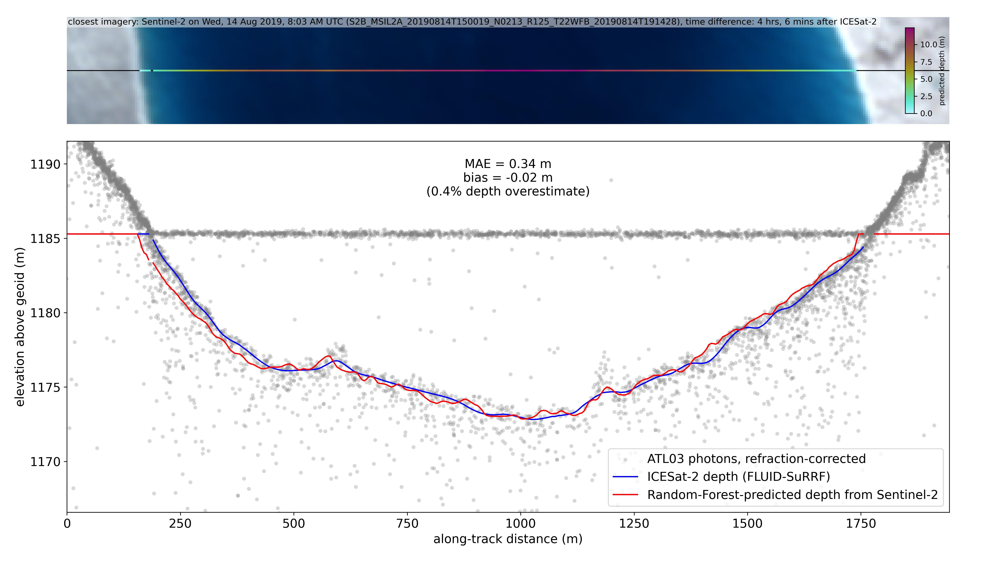

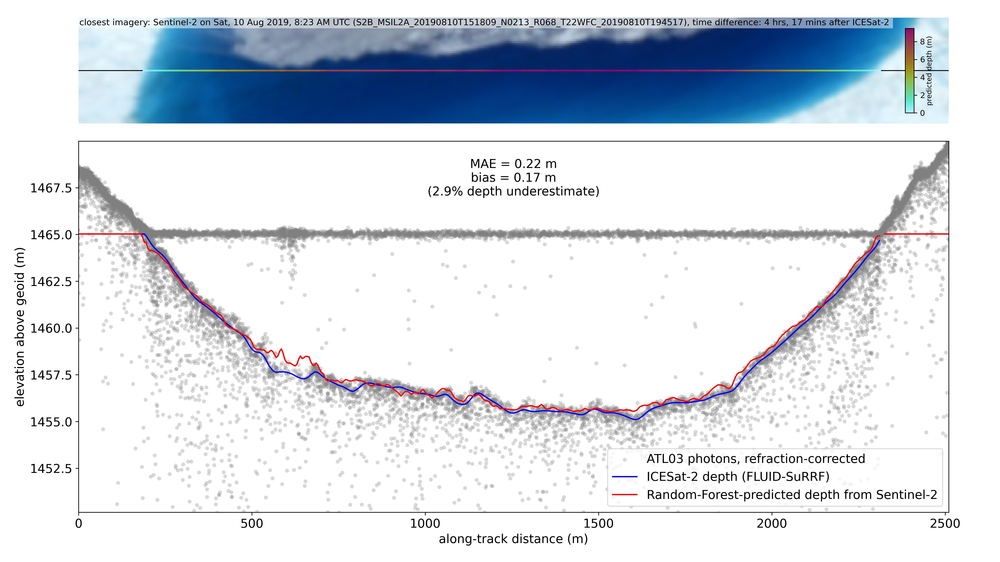

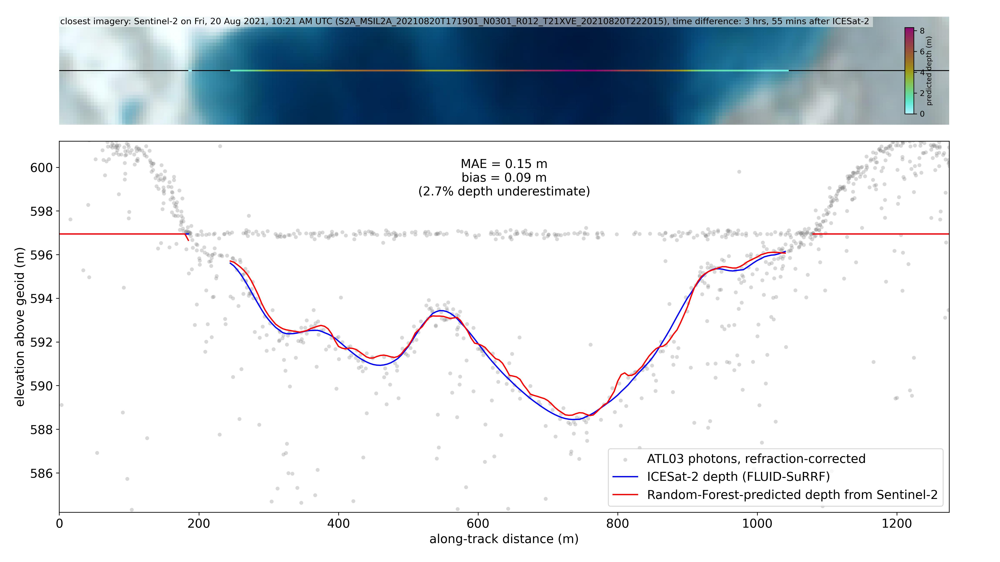

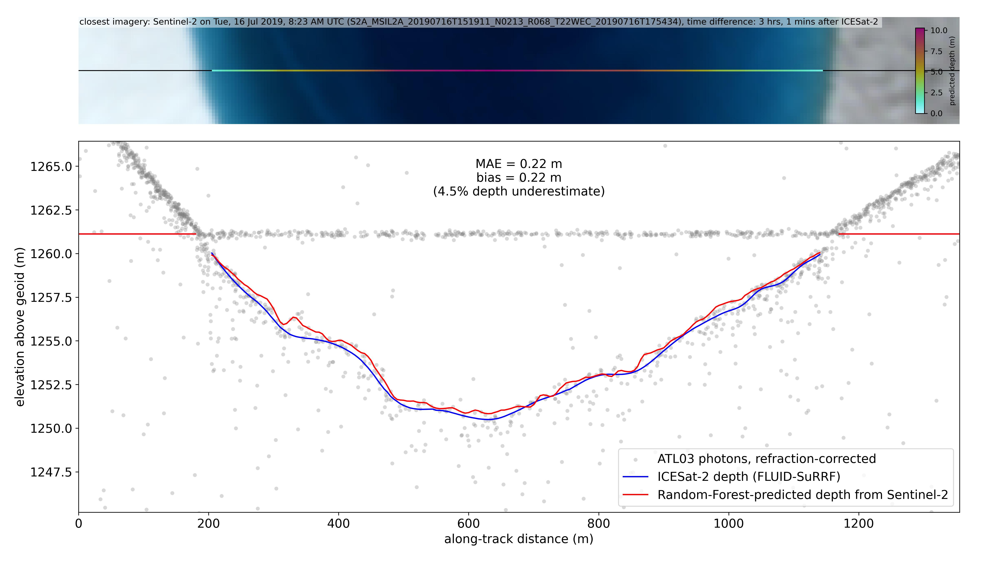

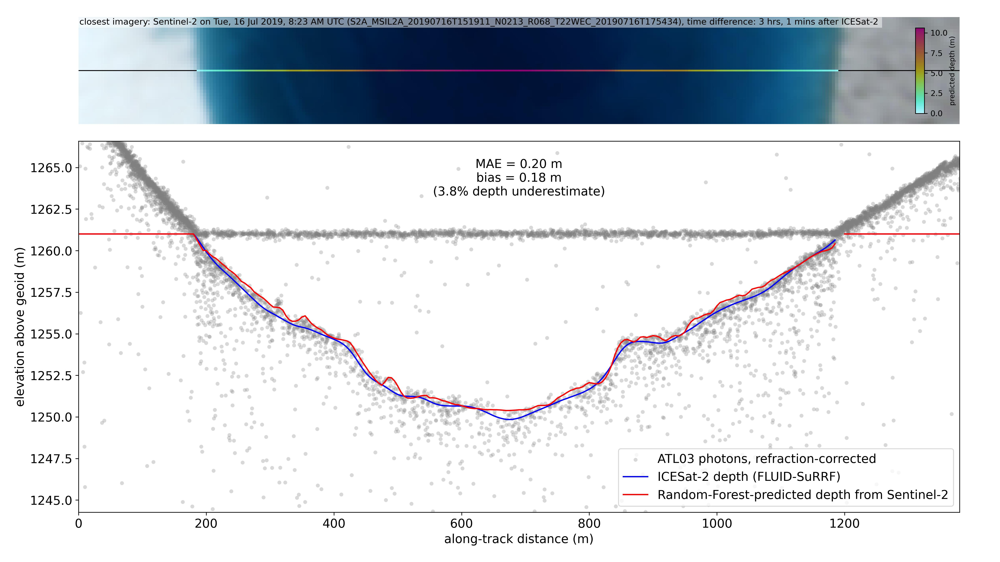

...

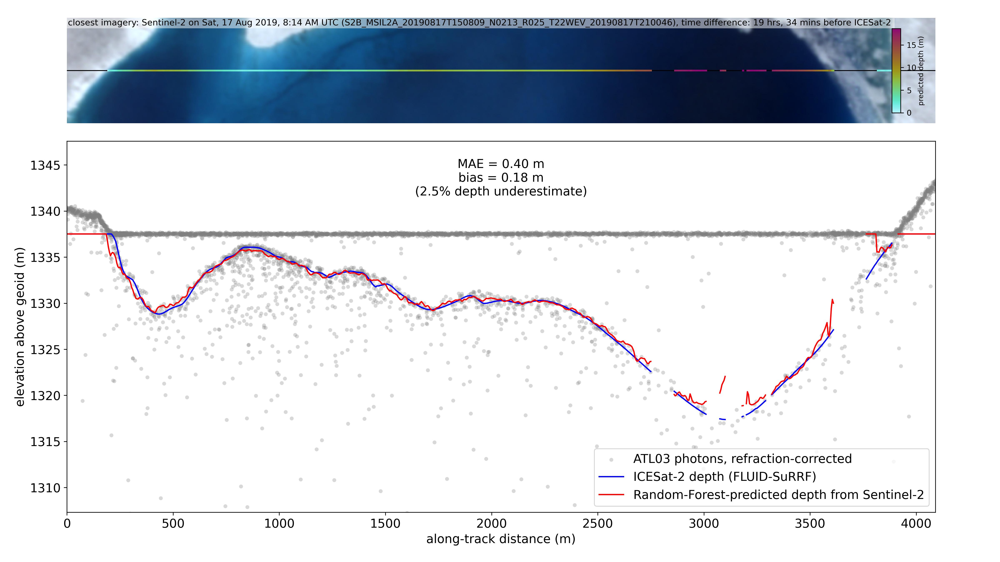

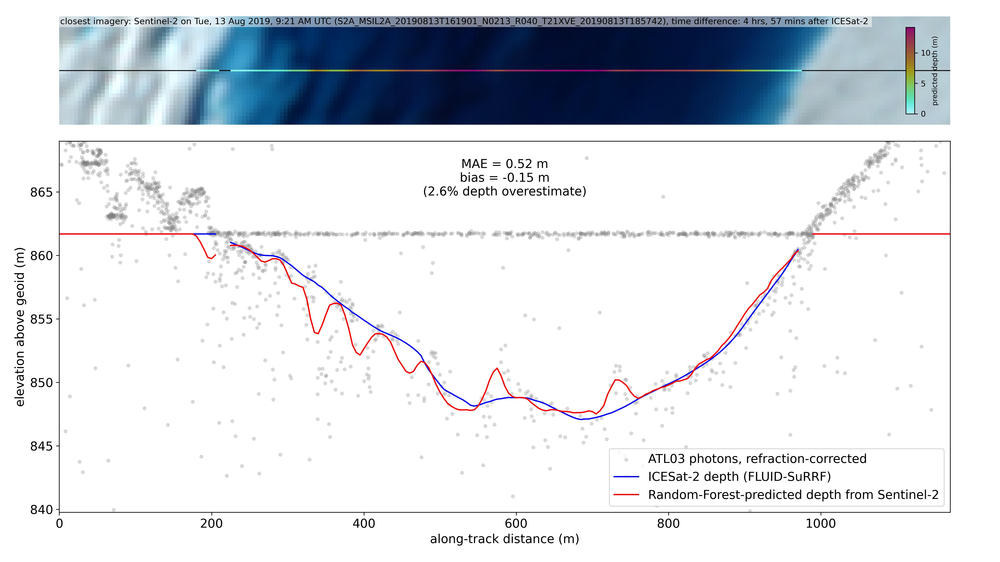

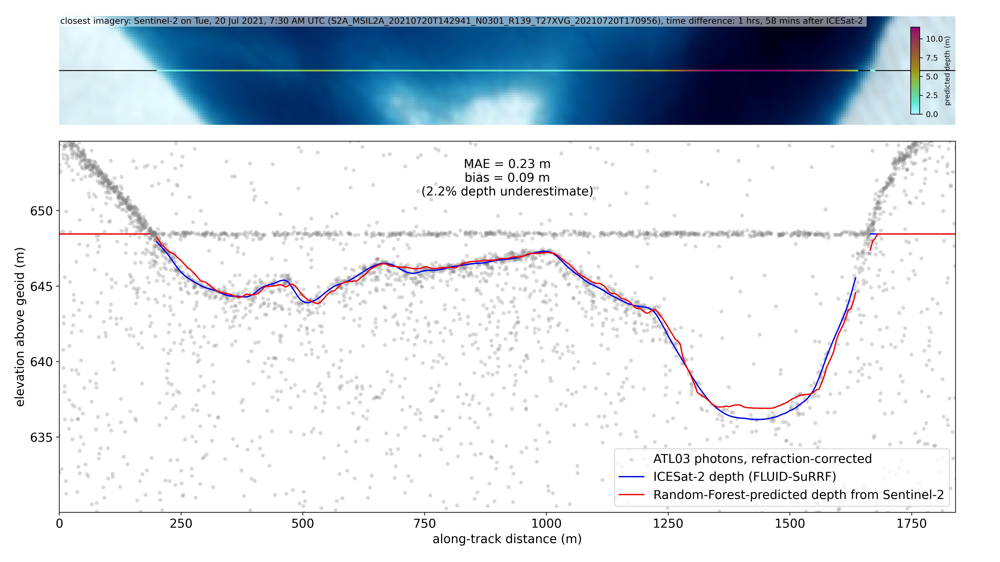

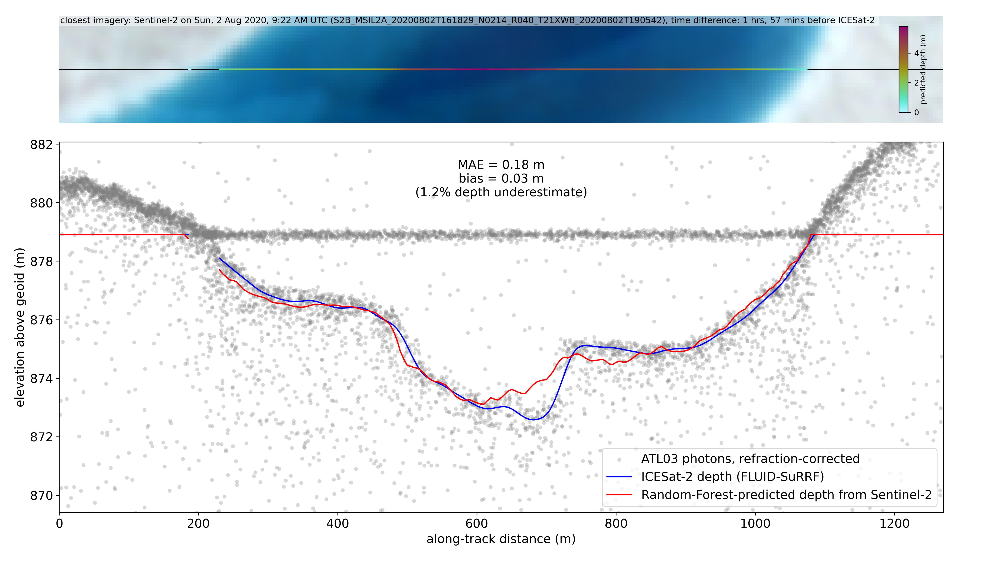

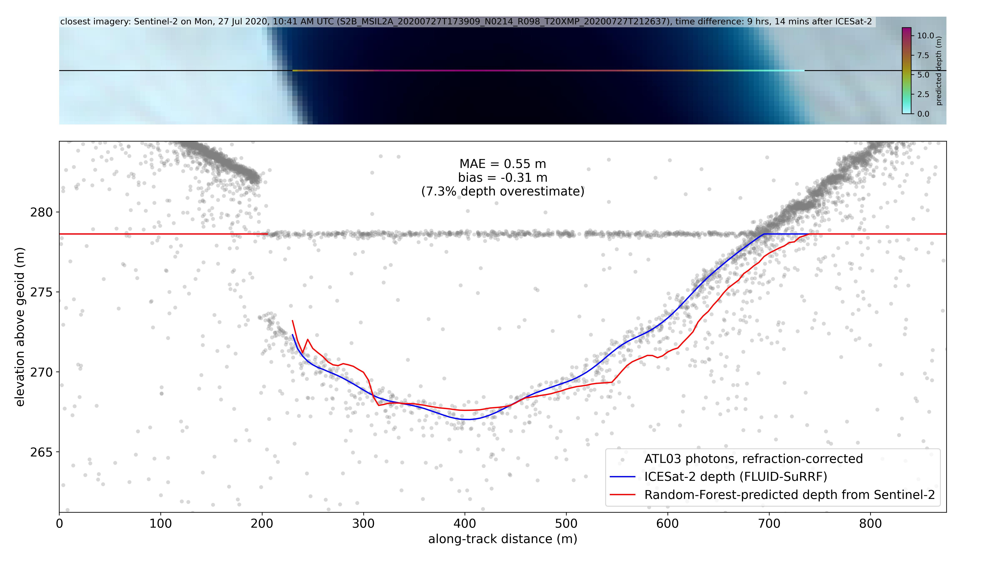

In [9]:
matplotlib.rcParams.update({'font.size': 14})
ref_idx = 1.336
for i, id in enumerate(valid_ids):
    fig = plt.figure(figsize=[16, 9], dpi=60)
    gs = fig.add_gridspec(nrows=4)
    axs = [fig.add_subplot(gs[1:])]
    axs.append(fig.add_subplot(gs[0], sharex=axs[0]))
    fn_atl03 = 'atl03_segments/%s.h5' % id
    fn_img = 'imagery_gt/%s_sentinel2_rgb.tif' % id
    lk_info = df_info.loc[id]
    lk = dictobj(read_melt_lake_h5(fn_atl03))
    dfp = lk.photon_data.copy()
    h_surf = lk.surface_elevation
    dfp.loc[dfp.h<h_surf, 'h'] = h_surf - (h_surf - lk.photon_data.loc[dfp.h<h_surf, 'h']) / ref_idx
    dfd = df_result_valid[df_result_valid.IS2_id == id].copy()
    dfd_ = dfd.set_index('xatc')
    dfd_plot = pd.DataFrame({'xatc': np.arange(dfd_.index.min(), dfd_.index.max(), 5), 'for_plotting': True}).set_index('xatc')
    dfd_plot = dfd_plot.join(dfd_)
    dfd_plot = dfd_plot.reset_index()
    dfd_plot.loc[dfd_plot.depth_pred < 0.1, 'depth_pred'] = 0.0
    xatc_depth_pred = dfd_plot.xatc.copy()
    xatc_depth_pred[dfd_plot.depth_pred <= 0.0] = np.nan

    ax = axs[0]
    ax.scatter(dfp.xatc, dfp.h, s=20, color='gray', alpha=0.3, edgecolors='none', label='ATL03 photons, refraction-corrected')
    ax.plot(dfd_plot.xatc, h_surf - dfd_plot.depth, 'b-', label='ICESat-2 depth (FLUID-SuRRF)')
    ax.plot(dfd_plot.xatc, h_surf - dfd_plot.depth_pred, 'r-', label='Random-Forest-predicted depth from Sentinel-2')

    xl = (dfd_plot.xatc.min(), dfd_plot.xatc.max())
    depth_range_max = dfd_plot[['depth', 'depth_pred']].max().max()
    yl = (h_surf - depth_range_max*1.5, h_surf + depth_range_max*0.5)
    ax.set_xlim(xl)
    ax.set_ylim(yl)

    isna = dfd_plot.depth.isna() | dfd_plot.depth_pred.isna()
    this_mae = mean_absolute_error(dfd_plot.depth[~isna], dfd_plot.depth_pred[~isna])
    this_bias = np.nanmean(dfd_plot.depth[~isna] - dfd_plot.depth_pred[~isna])
    this_percent = this_bias / np.nanmean(dfd_plot.depth[~isna]) * 100
    over_under = 'depth overestimate' if this_percent < 0.0 else 'depth underestimate'
    txt = 'MAE = %.2f m\nbias = %.2f m\n(%.1f%% %s)' % (this_mae, this_bias, np.abs(this_percent), over_under)
    ax.text(0.5, 0.9, txt, ha='center', va='center', transform=ax.transAxes)

    ax.set_ylabel('elevation above geoid (m)')
    ax.set_xlabel('along-track distance (m)')
    ax.legend(loc='lower right')

    ####--------------------------------------------
    #### plot imagery
    ax = axs[1]
    ax.axis('off')

    with rio.open(fn_img) as gtImage:
            rioplot.show(gtImage, ax=ax)
            crs_img = gtImage.crs
    try:
        fn_imgprops = fn_img.replace('.tif','_props.csv')
        df_props = pd.read_csv(fn_imgprops).iloc[0]
        product_id = df_props.product_id
        datetime_print_s2 = df_props.datetime_print_s2
        tdiff_str = df_props.tdiff_str
        txt = 'closest imagery: Sentinel-2 on %s (%s), time difference: %s ' % (datetime_print_s2, product_id, tdiff_str)
        if lk_info.n_scenes > 1:
            txt += '[all: %.1f - %.1f hrs]' % (lk_info.tdiff_sec_min/3600, lk_info.tdiff_sec_max/3600)
        tbx = ax.text(0.001, 0.99, txt, transform=ax.transAxes, ha='left', va='top', fontsize=10)
        tbbox = dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1.)
        tbx.set_bbox(tbbox)
    except:
        traceback.print_exc()
    
    ax.plot(dfd_plot.xatc, dfd_plot.xatc*0.0, 'k-', lw=1)

    data = pd.DataFrame({'x': xatc_depth_pred, 'y': xatc_depth_pred*0.0, 'c': dfd_plot.depth_pred})
    cmap = cmc.hawaii_r
    points = np.array([data.x, data.y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    lc = LineCollection(segments, cmap=cmap)
    lc.set_array(data.c)
    lc.set_linewidth(2)
    ax.add_collection(lc)

    cax = ax.inset_axes([0.95, 0.1, 0.01, 0.8])
    cbar = plt.colorbar(lc, cax=cax, orientation='vertical')
    cbar.set_label('predicted depth (m)', fontsize=8, labelpad=1.5)
    cax.tick_params(axis='both', which='major', labelsize=9)
    #cb = fig.colorbar(lc, ax=ax, label='line color')
    #ax.plot(xatc_depth_pred, xatc_depth_pred*0.0, 'r-')
    # ax.plot([intersection_pts.xatc.min(), intersection_pts.xatc.max()], [0, 0], 'r-')
    # ax.axis('off')
    axbbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    axis_aspect = axbbox.width/axbbox.height
    yl_img_pm = dfd_plot.xatc.max() / axis_aspect / 2
    ax.set_ylim((-yl_img_pm, yl_img_pm))

    fig.tight_layout()

    fig_out_fn = 'test_lakes_plots/%s_test.jpg' % id
    fig.savefig(fig_out_fn, dpi=300)
    plt.close(fig)
    display(Image(fig_out_fn))

In [ ]:
dfd

In [ ]:
from sklearn.ensemble import VotingRegressor

estimators = [('rf%i'%i, rfx) for i, rfx in enumerate(regressors)]
voting_regressor = VotingRegressor(estimators=estimators)

# Fit the ensemble model
depth_valid = voting_regressor.predict(pred_valid)


In [ ]:
# split the data set into test and training, by IS2_id
df_info_test = df_info.sample(frac=0.2, replace=False)
test_ids = df_info_test.index
is_test = df_feat.apply(lambda x: x.IS2_id in test_ids, axis=1)
df_feat_test = df_feat[is_test]
df_feat_train_full = df_feat[~is_test]
depth_test = df_feat_test.depth
pred_test = df_feat_test.iloc[:, 6:]

In [ ]:
from sklearn.neural_network import MLPRegressor

frac_train = 1.0
df_feat_train = df_feat_train_full.sample(frac=frac_train, replace=False)
depth_train = df_feat_train.depth
pred_train = df_feat_train.iloc[:, 6:]

print('training...', end=' ')
start_time = time.time()
mlp = MLPRegressor(hidden_layer_sizes=(200, 50, 10), max_iter=1000, early_stopping=True)
mlp.fit(pred_train, depth_train)
print('finished in %s' % duration_string(time.time() - start_time))

print('fitting...', end=' ')
start_time = time.time()
depth_pred_mlp = mlp.predict(pred_test)
depth_pred_mlp[depth_pred < 0.05] = 0.0
print('finished in %s' % duration_string(time.time() - start_time))

# Predictions and evaluation
mae = mean_absolute_error(depth_test, depth_pred_mlp)
mse = mean_squared_error(depth_test, depth_pred_mlp)
bias = np.nanmean(depth_test - depth_pred_mlp)
print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Mean Bias: {bias}')

df_result_test = df_feat_test.copy()
df_result_test['depth_pred'] = depth_pred_mlp

In [ ]:
# RANDOM FOREST


print('frac_train = %g\nn_estimators = %g\nmax_features = %g\nmax_samples = %g' % (frac_train, n_estimators, max_features, max_samples))

df_feat_train = df_feat_train_full.sample(frac=frac_train, replace=False)
depth_train = df_feat_train.depth
pred_train = df_feat_train.iloc[:, 6:]

# Random Forest Regression
print('training...', end=' ')
start_time = time.time()
rf = RandomForestRegressor(n_estimators=n_estimators, criterion='squared_error',# random_state=42, 
                           max_features=max_features, max_samples=max_samples, n_jobs=-1)
rf.fit(pred_train, depth_train)
print('finished in %s' % duration_string(time.time() - start_time))

print('fitting...', end=' ')
start_time = time.time()
depth_pred = rf.predict(pred_test)
depth_pred[depth_pred < 0.05] = 0.0
depth_pred[pred_test.ndwi < 0.1] = 0.0
print('finished in %s' % duration_string(time.time() - start_time))

# Predictions and evaluation
mae = mean_absolute_error(depth_test, depth_pred)
mse = mean_squared_error(depth_test, depth_pred)
bias = np.nanmean(depth_test - depth_pred)
print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Mean Bias: {bias}')

df_result_test = df_feat_test.copy()
df_result_test['depth_pred'] = depth_pred

In [ ]:
frac_train = 1
n_estimators = 500
max_features = 0.5
max_samples = 0.1
training... finished in 51 secs
fitting... finished in 0 secs
Mean Absolute Error: 0.3551955411898589
Mean Squared Error: 0.8826183907411801
Mean Bias: 0.02920927952367735

In [ ]:
from sklearn.inspection import permutation_importance

start_time = time.time()
result = permutation_importance(rf, pred_test, depth_test, n_repeats=10, n_jobs=-1, max_samples=0.1)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {duration_string(elapsed_time)} seconds")

forest_importances = pd.Series(result.importances_mean, index=list(pred_test))

In [ ]:
matplotlib.rcParams.update({'font.size': 7})
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, tick_label=list(pred_test), ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [ ]:
# frac_train = 1
# n_estimators = 300
# max_features = 0.5
# training... finished in 1 hrs, 26 mins, 19 secs
# fitting... finished in 0 secs
# Mean Absolute Error: 0.4024154411221477
# Mean Squared Error: 0.41666215642674453
# Mean Bias: 0.15877720149604335

In [ ]:
# frac_train = 0.2
# n_estimators = 200
# max_features = 0.5
# training... finished in 8 mins, 59 secs
# fitting... finished in 0 secs
# Mean Absolute Error: 0.41526102442672636
# Mean Squared Error: 0.4412601033120553
# Mean Bias: 0.17698143518595236

In [ ]:
# frac_train = 0.05
# n_estimators = 100
# max_features = 0.5
# training... finished in 48 secs
# fitting... finished in 0 secs
# Mean Absolute Error: 0.5039408774788092
# Mean Squared Error: 0.7708028309580067
# Mean Bias: 0.22040550307460657

In [ ]:
df_result_test = df_feat_test.copy()
depth_pred[depth_pred < 0.05] = 0.0
depth_pred[pred_test.ndwi < 0.1] = 0.0
df_result_test['depth_pred'] = depth_pred

matplotlib.rcParams.update({'font.size': 14})
ref_idx = 1.336
for i, id in enumerate(test_ids[:30]):
    fig = plt.figure(figsize=[16, 9], dpi=60)
    gs = fig.add_gridspec(nrows=4)
    axs = [fig.add_subplot(gs[1:])]
    axs.append(fig.add_subplot(gs[0], sharex=axs[0]))
    fn_atl03 = 'atl03_segments/%s.h5' % id
    fn_img = 'imagery_gt/%s_sentinel2_rgb.tif' % id
    lk_info = df_info.loc[id]
    lk = dictobj(read_melt_lake_h5(fn_atl03))
    dfp = lk.photon_data.copy()
    h_surf = lk.surface_elevation
    dfp.loc[dfp.h<h_surf, 'h'] = h_surf - (h_surf - lk.photon_data.loc[dfp.h<h_surf, 'h']) / ref_idx
    dfd = df_result_test[df_result_test.IS2_id == id].copy()
    dfd_ = dfd.set_index('xatc')
    dfd_plot = pd.DataFrame({'xatc': np.arange(dfd_.index.min(), dfd_.index.max(), 5), 'for_plotting': True}).set_index('xatc')
    dfd_plot = dfd_plot.join(dfd_)
    dfd_plot = dfd_plot.reset_index()
    dfd_plot.loc[dfd_plot.depth_pred < 0.1, 'depth_pred'] = 0.0
    xatc_depth_pred = dfd_plot.xatc.copy()
    xatc_depth_pred[dfd_plot.depth_pred <= 0.0] = np.nan

    ax = axs[0]
    ax.scatter(dfp.xatc, dfp.h, s=20, color='gray', alpha=0.3, edgecolors='none', label='ATL03 photons, refraction-corrected')
    ax.plot(dfd_plot.xatc, h_surf - dfd_plot.depth, 'b-', label='ICESat-2 depth (FLUID-SuRRF)')
    ax.plot(dfd_plot.xatc, h_surf - dfd_plot.depth_pred, 'r-', label='RF-predicted depth from Sentinel-2')

    xl = (dfd_plot.xatc.min(), dfd_plot.xatc.max())
    depth_range_max = dfd_plot[['depth', 'depth_pred']].max().max()
    yl = (h_surf - depth_range_max*1.5, h_surf + depth_range_max*0.5)
    ax.set_xlim(xl)
    ax.set_ylim(yl)

    isna = dfd_plot.depth.isna() | dfd_plot.depth_pred.isna()
    this_mae = mean_absolute_error(dfd_plot.depth[~isna], dfd_plot.depth_pred[~isna])
    this_bias = np.nanmean(dfd_plot.depth[~isna] - dfd_plot.depth_pred[~isna])
    this_percent = this_bias / np.nanmean(dfd_plot.depth[~isna]) * 100
    over_under = 'depth overestimate' if this_percent < 0.0 else 'depth underestimate'
    txt = 'MAE = %.2f m\nbias = %.2f m\n(%.1f%% %s)' % (this_mae, this_bias, np.abs(this_percent), over_under)
    ax.text(0.5, 0.9, txt, ha='center', va='center', transform=ax.transAxes)

    ax.set_ylabel('elevation above geoid (m)')
    ax.set_xlabel('along-track distance (m)')
    ax.legend(loc='lower right')

    ####--------------------------------------------
    #### plot imagery
    ax = axs[1]
    ax.axis('off')

    with rio.open(fn_img) as gtImage:
            rioplot.show(gtImage, ax=ax)
            crs_img = gtImage.crs
    try:
        fn_imgprops = fn_img.replace('.tif','_props.csv')
        df_props = pd.read_csv(fn_imgprops).iloc[0]
        product_id = df_props.product_id
        datetime_print_s2 = df_props.datetime_print_s2
        tdiff_str = df_props.tdiff_str
        txt = 'closest imagery: Sentinel-2 on %s (%s), time difference: %s ' % (datetime_print_s2, product_id, tdiff_str)
        if lk_info.n_scenes > 1:
            txt += '[all: %.1f - %.1f hrs]' % (lk_info.tdiff_sec_min/3600, lk_info.tdiff_sec_max/3600)
        tbx = ax.text(0.001, 0.99, txt, transform=ax.transAxes, ha='left', va='top', fontsize=10)
        tbbox = dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1.)
        tbx.set_bbox(tbbox)
    except:
        traceback.print_exc()
    
    ax.plot(dfd_plot.xatc, dfd_plot.xatc*0.0, 'k-', lw=1)

    data = pd.DataFrame({'x': xatc_depth_pred, 'y': xatc_depth_pred*0.0, 'c': dfd_plot.depth_pred})
    cmap = cmc.hawaii_r
    points = np.array([data.x, data.y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    lc = LineCollection(segments, cmap=cmap)
    lc.set_array(data.c)
    lc.set_linewidth(2)
    ax.add_collection(lc)

    cax = ax.inset_axes([0.95, 0.1, 0.01, 0.8])
    cbar = plt.colorbar(lc, cax=cax, orientation='vertical')
    cbar.set_label('predicted depth (m)', fontsize=8, labelpad=1.5)
    cax.tick_params(axis='both', which='major', labelsize=9)
    #cb = fig.colorbar(lc, ax=ax, label='line color')
    #ax.plot(xatc_depth_pred, xatc_depth_pred*0.0, 'r-')
    # ax.plot([intersection_pts.xatc.min(), intersection_pts.xatc.max()], [0, 0], 'r-')
    # ax.axis('off')
    axbbox = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    axis_aspect = axbbox.width/axbbox.height
    yl_img_pm = dfd_plot.xatc.max() / axis_aspect / 2
    ax.set_ylim((-yl_img_pm, yl_img_pm))

    fig.tight_layout()

    fig_out_fn = 'test_lakes_plots/%s_test.jpg' % id
    # fig.savefig(fig_out_fn, dpi=300)
    # display(Image(fig_out_fn))
    plt.close(fig)
    display(fig)